In [1]:
# import logging
import os
import re
from pathlib import Path
from collections import Counter

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import torch
import yaml
from einops import rearrange

In [2]:
%load_ext autoreload

In [3]:
%autoreload 2

In [4]:
from mushroom.mushroom_v4 import Mushroom
import mushroom.utils as utils

/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packag

In [5]:
run_dir = '/data/estorrs/mushroom/data/projects/subclone'
mushroom_dir = os.path.join(run_dir, 'mushroom')
config_fps = sorted(utils.listfiles(mushroom_dir, regex=r'/config.yaml'))
config_fps

['/data/estorrs/mushroom/data/projects/subclone/mushroom/HT112C1/config.yaml',
 '/data/estorrs/mushroom/data/projects/subclone/mushroom/HT206B1/config.yaml',
 '/data/estorrs/mushroom/data/projects/subclone/mushroom/HT225C1/config.yaml',
 '/data/estorrs/mushroom/data/projects/subclone/mushroom/HT226C1/config.yaml',
 '/data/estorrs/mushroom/data/projects/subclone/mushroom/HT235B1/config.yaml',
 '/data/estorrs/mushroom/data/projects/subclone/mushroom/HT243B1-H3/config.yaml',
 '/data/estorrs/mushroom/data/projects/subclone/mushroom/HT243B1-H4/config.yaml',
 '/data/estorrs/mushroom/data/projects/subclone/mushroom/HT268B1/config.yaml',
 '/data/estorrs/mushroom/data/projects/subclone/mushroom/HT271B1/config.yaml',
 '/data/estorrs/mushroom/data/projects/subclone/mushroom/HT339B1/config.yaml',
 '/data/estorrs/mushroom/data/projects/subclone/mushroom/HT397B1/config.yaml',
 '/data/estorrs/mushroom/data/projects/subclone/mushroom/HT413C1/config.yaml',
 '/data/estorrs/mushroom/data/projects/subclon

In [6]:
mushroom_config = {
    'dtype': 'visium',
#     'sections': config,
    'chkpt_filepath': None,
    'sae_kwargs': {
        'size': 256,
        'patch_size': 32,
        'triplet_scaler': .001,
        'recon_scaler': 1.,
        'encoder_dim': 256,
        'decoder_dim': 256,
    },
    'learner_kwargs': {
        'scale': .1,
        'pct_expression': .02,
        'batch_size': 32,
        'num_workers': 1,
        'device': 'cuda:1',
#         'channels': channels,
#         'channel_mapping': channel_mapping
    },
    'train_kwargs': {
        'num_iters': 10000,
        'lr': 1e-4,
        'log_every': 10,
        'save_every': 1000,
#         'save_dir': chkpt_dir       
    },
    'cluster_kwargs': {
        'num_clusters': 20,
        'mask_background': True,
        'margin': .05,
        'background_channels': None,
        'span_all_sections': True,
        'centroids': None,
    }
}

In [7]:
# config_fp = '/data/estorrs/mushroom/data/projects/subclone/mushroom/HT112C1/config.yaml'
config_fp = '/data/estorrs/mushroom/data/projects/subclone/mushroom/HT268B1/config.yaml'

# config_fp = '/data/estorrs/mushroom/data/projects/subclone/mushroom/HT397B1/config.yaml'
case = config_fp.split('/')[-2]
out_dir = os.path.join(f'/data/estorrs/mushroom/data/projects/subclone/mushroom/{case}_vae_vq/outputs')

# config_fp = '/data/estorrs/mushroom/data/examples/HT397B1_v1/mushroom_outputs/visium_v2'
# out_dir = os.path.join(f'/data/estorrs/mushroom/data/projects/subclone/mushroom/{case}_vq/outputs')


config = yaml.safe_load(open(config_fp))

chkpt_dir = os.path.join(out_dir, 'chkpts')
Path(chkpt_dir).mkdir(parents=True, exist_ok=True)

In [8]:
mushroom_config['sections'] = config
mushroom_config['train_kwargs']['save_dir'] = chkpt_dir
mushroom_config['chkpt_filepath'] = os.path.join(chkpt_dir, 'final.pt')

In [9]:
mushroom = Mushroom.from_config(mushroom_config)

INFO:root:using device: cuda:1
INFO:root:generating inputs for visium tissue sections
INFO:root:using 13417 channels
INFO:root:5 sections detected: ['s0', 's1', 's2', 's3', 's4']
INFO:root:processing sections
INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:learner initialized
INFO:root:initializing clusterer
INFO:root:no background channel detected, defaulting to mean of all channels


In [10]:
mushroom.embed_sections()

array([[<Axes: title={'center': 's0'}, ylabel='predicted'>,
        <Axes: title={'center': 's1'}>, <Axes: title={'center': 's2'}>,
        <Axes: title={'center': 's3'}>, <Axes: title={'center': 's4'}>],
       [<Axes: ylabel='true'>, <Axes: >, <Axes: >, <Axes: >, <Axes: >]],
      dtype=object)

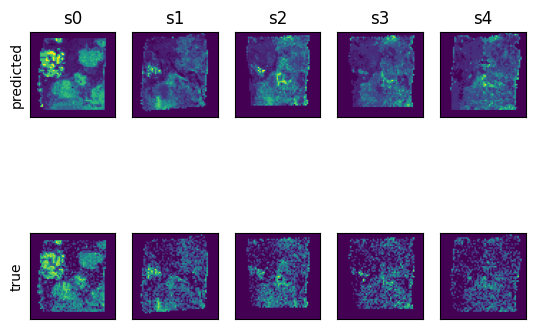

In [11]:
mushroom.display_predicted_pixels(channel='EPCAM')

array([[<Axes: title={'center': 's0'}, ylabel='predicted'>,
        <Axes: title={'center': 's1'}>, <Axes: title={'center': 's2'}>,
        <Axes: title={'center': 's3'}>, <Axes: title={'center': 's4'}>],
       [<Axes: ylabel='true'>, <Axes: >, <Axes: >, <Axes: >, <Axes: >]],
      dtype=object)

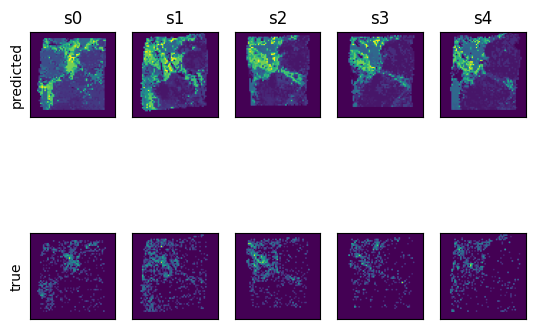

In [12]:
mushroom.display_predicted_pixels(channel='IL7R')

array([[<Axes: title={'center': 's0'}, ylabel='predicted'>,
        <Axes: title={'center': 's1'}>, <Axes: title={'center': 's2'}>,
        <Axes: title={'center': 's3'}>, <Axes: title={'center': 's4'}>],
       [<Axes: ylabel='true'>, <Axes: >, <Axes: >, <Axes: >, <Axes: >]],
      dtype=object)

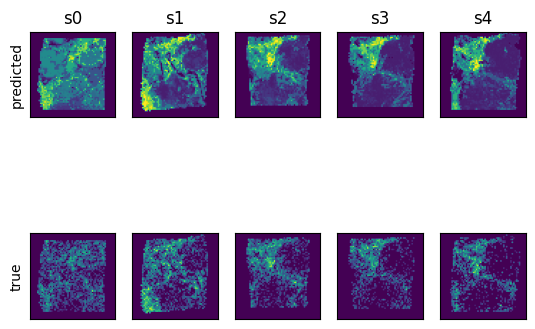

In [13]:
mushroom.display_predicted_pixels(channel='CD68')

In [14]:
mushroom.cluster_sections(margin=.1)

INFO:root:no background channel detected, defaulting to mean of all channels
/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/joblib/externals/loky/backend/context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[Errno 13] Permission denied: 'lscpu'
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/joblib/externals/loky/backend/context.py", line 250, in _count_physical_cores
    cpu_info = subprocess.run(
  File "/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/subprocess.py", line 505, in run
    with Popen(*popenargs, **kwargs) as process:
  File "/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/subprocess.py", line 951, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "/data/estorrs/miniconda3/en

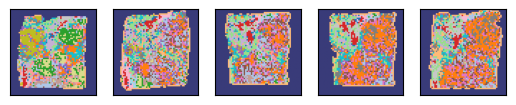

In [15]:
mushroom.clusterer.display_cluster_ids(mushroom.cluster_ids)

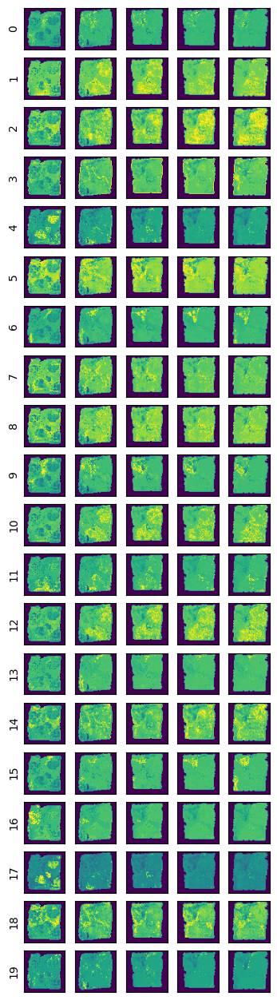

In [16]:
mushroom.clusterer.display_distances(mushroom.dists, figsize=(4, 16))

In [18]:
def relabel(labels):
    new = np.zeros_like(labels, dtype=labels.dtype)
    ids = np.unique(labels)
    for i in range(len(ids)):
        new[labels==ids[i]] = i
        
    return new

cluster_ids = mushroom.dists.argmin(-1).numpy()
cluster_ids = relabel(cluster_ids)
cluster_ids.shape

(5, 60, 60)

In [19]:
import seaborn as sns
from mushroom.visualization.utils import display_labeled_as_rgb

In [20]:
def show_legend(ids, cmap):
    labels = np.unique(ids)
    fig, axs = plt.subplots(ncols=len(labels))
    for n, l in enumerate(labels):
        axs[n].imshow(rearrange(np.asarray(cmap[l]), 'n -> 1 1 n'))
        axs[n].axis('off')
        axs[n].set_title(str(l), rotation=90)


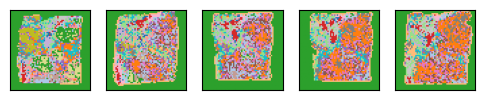

In [21]:
cmap = sns.color_palette('tab20') + sns.color_palette('tab20b') + sns.color_palette('tab20c')
cmap += cmap
cmap += cmap
fig, axs = plt.subplots(ncols=cluster_ids.shape[0], figsize=(6, 4))
for i, labeled in enumerate(cluster_ids):
    axs[i].imshow(display_labeled_as_rgb(labeled, cmap=cmap))
    axs[i].set_xticks([])
    axs[i].set_yticks([])

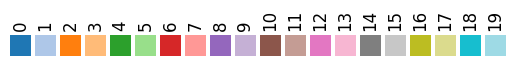

In [22]:
show_legend(cluster_ids, cmap)

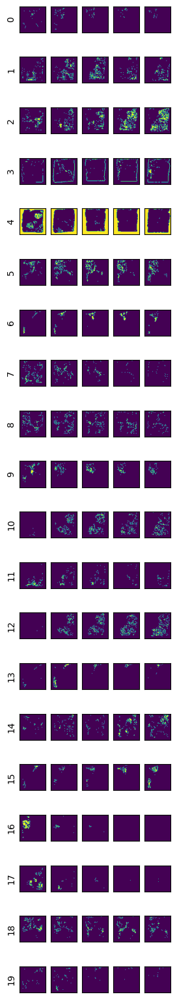

In [23]:
fig, axs = plt.subplots(nrows=cluster_ids.max() + 1, ncols=cluster_ids.shape[0], figsize=(3, 20))
for i in range(cluster_ids.max() + 1):
    for j in range(cluster_ids.shape[0]):
        ax = axs[i, j]
        ax.imshow(cluster_ids[j] == i)
#         ax.axis('off')
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel('')
        ax.set_ylabel('')
        
        if j == 0:
            ax.set_ylabel(i)
            

In [24]:
exp = []
for i in range(cluster_ids.max() + 1):
    mask = cluster_ids == i
    x = rearrange(mushroom.recon_imgs, 'n d h w -> d n h w')
    exp.append(x[:, mask].mean(-1))
exp = torch.stack(exp)
exp = pd.DataFrame(data=exp.numpy(), columns=mushroom.learner.channels)
exp = exp[~pd.isnull(exp.iloc[:, 0])]
exp


,A1BG,A1BG-AS1,A1CF,A2M,A2ML1,A4GALT,AAAS,AACS,AADAC,AADAT,...,ZUP1,ZW10,ZWILCH,ZWINT,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1
0,1.091797,-0.033615,0.577579,1.784707,-0.425437,0.542569,0.087325,-0.070162,0.979596,-0.052807,...,-0.125453,-0.074953,-0.181182,-0.365154,0.106514,-0.075624,-0.143213,0.190045,0.915113,0.152102
1,-0.089707,0.136006,-0.155456,-0.196950,0.482322,-0.070045,0.203299,0.228908,-0.191505,0.163178,...,0.254084,0.274639,0.344378,0.465942,0.087083,0.275397,0.142704,0.078395,0.240917,0.123096
2,-0.523620,-0.129364,-0.225920,-0.592379,-0.143498,-0.123218,-0.270652,-0.203187,-0.309861,-0.143249,...,-0.176380,-0.219390,-0.193714,-0.136531,-0.142148,-0.201396,-0.082744,-0.205232,-0.523609,-0.198575
3,-0.883382,-0.273492,-0.292148,-0.977388,-0.552951,-0.181403,-0.578517,-0.446199,-0.378082,-0.302693,...,-0.398730,-0.455406,-0.453268,-0.613895,-0.256362,-0.477392,-0.224238,-0.361628,-1.026880,-0.429184
4,-0.832527,-0.231900,-0.285124,-0.911701,-0.453701,-0.170775,-0.496740,-0.384785,-0.368547,-0.261176,...,-0.333236,-0.376693,-0.374585,-0.520355,-0.219274,-0.405189,-0.189392,-0.313118,-0.905131,-0.377221
5,0.090059,-0.081544,-0.086287,0.241320,-0.448311,0.069351,-0.246047,-0.255162,-0.075257,-0.182546,...,-0.241558,-0.281331,-0.311543,-0.425768,-0.131251,-0.284368,-0.155057,-0.127614,-0.129013,-0.117949
6,2.750080,-0.009029,2.255470,1.895546,-0.364796,0.110972,0.273956,-0.053049,3.065821,0.373495,...,-0.065630,0.008796,-0.188584,-0.293357,0.298827,0.105788,-0.012367,0.386394,0.583185,0.241062
7,-0.007424,0.092009,-0.132147,0.465199,-0.073894,0.183280,0.148506,0.052496,-0.130520,-0.049174,...,0.040747,0.089339,-0.028700,-0.107920,0.006476,0.028466,0.005466,0.127178,0.495945,0.137029
8,-0.171144,0.020450,-0.155780,-0.037497,-0.098657,0.003056,-0.018566,-0.006785,-0.219408,-0.046717,...,-0.036729,-0.010345,-0.019668,-0.068122,-0.028308,-0.061091,0.003272,0.007030,0.016730,-0.027332
9,0.382288,-0.016123,-0.006736,1.029112,-0.455466,0.437437,-0.120497,-0.151916,0.100671,-0.162687,...,-0.253456,-0.229883,-0.307557,-0.446070,-0.078474,-0.207759,-0.164076,0.002834,0.405762,0.008629


In [25]:
from sklearn.cluster import AgglomerativeClustering
dist = 30.
clustering = AgglomerativeClustering(n_clusters=None, distance_threshold=dist).fit(exp.values)
# clustering = AgglomerativeClustering(n_clusters=10, distance_threshold=None).fit(exp.values)
cluster_to_label = {c:l for c, l in zip(exp.index, clustering.labels_)}
neigh_ids = np.vectorize(cluster_to_label.get)(cluster_ids)
len(np.unique(neigh_ids))

14

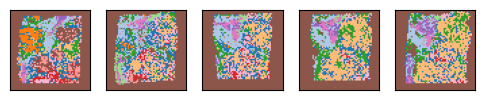

In [26]:
cmap = sns.color_palette('tab20') + sns.color_palette('tab20b') + sns.color_palette('tab20c')
cmap += cmap
cmap += cmap
fig, axs = plt.subplots(ncols=neigh_ids.shape[0], figsize=(6, 4))
for i, labeled in enumerate(neigh_ids):
    axs[i].imshow(display_labeled_as_rgb(labeled, cmap=cmap))
    axs[i].set_xticks([])
    axs[i].set_yticks([])

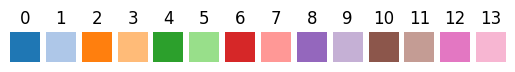

In [27]:
labels = np.unique(neigh_ids)
fig, axs = plt.subplots(ncols=len(labels))
for n, l in enumerate(labels):
    axs[n].imshow(rearrange(np.asarray(cmap[l]), 'n -> 1 1 n'))
    axs[n].axis('off')
    axs[n].set_title(str(l))
    

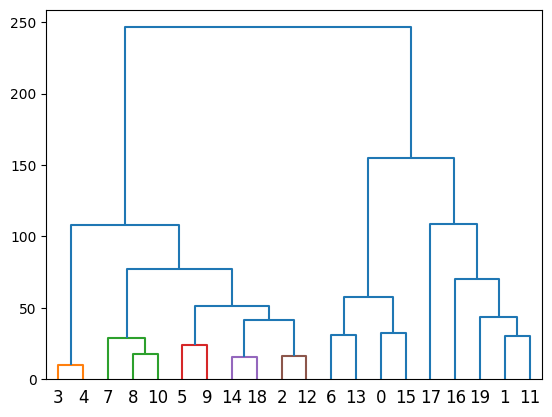

In [28]:
import scipy.cluster.hierarchy as shc
links = shc.linkage(exp.values, method ='ward')
dendrogram = shc.dendrogram((links), color_threshold=dist, labels=exp.index.to_list())

In [29]:
mushroom.learner.inference_ds.section_to_img['s0'].shape

torch.Size([1, 1888, 1964])

In [30]:
torch.unique(mushroom.learner.inference_ds.section_to_img['s0'])

tensor([   0,    1,    2,  ..., 4233, 4234, 4235])

In [31]:
mushroom.learner.inference_ds.section_to_tiles['s0'].shape

torch.Size([15, 15, 1, 256, 256])

In [32]:
256 / 8

32.0

In [33]:
mushroom.learner.inference_ds.section_to_tiles

{'s0': tensor([[[[[   0,    0,    0,  ...,    0,    0,    0],
            [   0,    0,    0,  ...,    0,    0,    0],
            [   0,    0,    0,  ...,    0,    0,    0],
            ...,
            [   0,    0,    0,  ...,    0,    0,    0],
            [   0,    0,    0,  ...,    0,    0,    0],
            [   0,    0,    0,  ...,    0,    0,    0]]],
 
 
          [[[   0,    0,    0,  ...,    0,    0,    0],
            [   0,    0,    0,  ...,    0,    0,    0],
            [   0,    0,    0,  ...,    0,    0,    0],
            ...,
            [   0,    0,    0,  ...,    0,    0,    0],
            [   0,    0,    0,  ...,    0,    0,    0],
            [   0,    0,    0,  ...,    0,    0,    0]]],
 
 
          [[[   0,    0,    0,  ...,    0,    0,    0],
            [   0,    0,    0,  ...,    0,    0,    0],
            [   0,    0,    0,  ...,    0,    0,    0],
            ...,
            [   0,    0,    0,  ...,    0,    0,    0],
            [   0,    0,    0,  ...

In [34]:
ds = mushroom.learner.inference_ds

imgs = []
for idx in range(len(ds)):
    section_idx, row_idx, col_idx = ds.idx_to_coord[idx]
    section = ds.sections[section_idx]
    img = ds.section_to_tiles[section][row_idx, col_idx]
    imgs.append(img)
imgs = torch.stack(imgs)

recon_labeled = torch.stack(
    [ds.section_from_tiles(
        imgs, i,
#         size=(mushroom.learner.train_transform.output_size[0], mushroom.learner.train_transform.output_size[1])
    ) for i in range(len(ds.sections))]
)

In [54]:
recon_labeled.shape, len(recon_labeled.unique())

(torch.Size([5, 1, 1920, 1920]), 4354)

In [56]:
np.unique(cluster_ids)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19])

In [36]:
import torchvision.transforms.functional as TF
patch_size = 32
resized_cluster_ids = TF.resize(
    torch.tensor(cluster_ids),
    (recon_labeled.shape[-2], recon_labeled.shape[-1]),
    antialias=False,
    interpolation=TF.InterpolationMode.NEAREST
).numpy()
resized_cluster_ids.shape

(5, 1920, 1920)

In [55]:
np.unique(resized_cluster_ids)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19])

In [37]:
from skimage.measure import regionprops

for section_idx in range(len(ds.sections)):
    section = ds.sections[section_idx]
    a = ds.section_to_adata[section]
    labeled = recon_labeled[section_idx]

    props = regionprops(labeled.to(torch.int32).numpy())
    a.obsm['spatial_scaled'] = np.zeros_like(a.obsm['spatial'])
    for prop in props:
        _, r, c = prop.centroid
        a.obsm['spatial_scaled'][prop.label - 1] = [c, r]
        
    ds.section_to_adata[section] = a

In [38]:
a.obs

,in_tissue,array_row,array_col,FC1,FC2,FC3,FC4,FC5,FC6,Filtered tumor regions,...,TME boundary,Tumor before boundary,Tumor boundary,Tumor regions,Tumor vs. TME,barcode,library_id,original,sample_id,subclone
HT268B1-U32_AAACAAGTATCTCCCA-1,1,50,102,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,0.0,TME,AAACAAGTATCTCCCA-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.714296,HT268B1-U32,
HT268B1-U32_AAACACCAATAACTGC-1,1,59,19,3.0,466.0,3.0,466.0,3.0,466.0,1.0,...,NaN,NaN,NaN,1.0,Tumor,AAACACCAATAACTGC-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.866085,HT268B1-U32,clone_2
HT268B1-U32_AAACAGAGCGACTCCT-1,1,14,94,4.0,617.0,4.0,617.0,4.0,617.0,2.0,...,NaN,NaN,NaN,2.0,Tumor,AAACAGAGCGACTCCT-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.873439,HT268B1-U32,clone_2
HT268B1-U32_AAACAGCTTTCAGAAG-1,1,43,9,4.0,614.0,4.0,614.0,4.0,614.0,1.0,...,NaN,NaN,NaN,1.0,Tumor,AAACAGCTTTCAGAAG-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.887271,HT268B1-U32,clone_2
HT268B1-U32_AAACAGGGTCTATATT-1,1,47,13,7.0,1393.0,8.0,1453.0,unknown,0.0,1.0,...,NaN,NaN,NaN,1.0,Tumor,AAACAGGGTCTATATT-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.872409,HT268B1-U32,clone_2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT268B1-U32_TTGTTGTGTGTCAAGA-1,1,31,77,7.0,1296.0,7.0,1296.0,7.0,1296.0,2.0,...,NaN,NaN,NaN,2.0,Tumor,TTGTTGTGTGTCAAGA-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.884026,HT268B1-U32,clone_2
HT268B1-U32_TTGTTTCACATCCAGG-1,1,58,42,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,0.0,TME,TTGTTTCACATCCAGG-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.742382,HT268B1-U32,
HT268B1-U32_TTGTTTCATTAGTCTA-1,1,60,30,2.0,232.0,2.0,232.0,2.0,232.0,1.0,...,NaN,Tumor before boundary,NaN,1.0,Tumor,TTGTTTCATTAGTCTA-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.811824,HT268B1-U32,clone_2
HT268B1-U32_TTGTTTCCATACAACT-1,1,45,27,7.0,1234.0,7.0,1234.0,7.0,1234.0,1.0,...,NaN,NaN,NaN,1.0,Tumor,TTGTTTCCATACAACT-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.863733,HT268B1-U32,clone_2


In [39]:
for section_idx in range(len(ds.sections)):
    section = ds.sections[section_idx]
    a = ds.section_to_adata[section]
    
    a.obs['cluster'] = [str(resized_cluster_ids[section_idx, r, c]) for c, r in a.obsm['spatial_scaled']]
    ds.section_to_adata[section] = a

In [40]:
tups = [(sub, clust) for a in ds.section_to_adata.values()
        for sub, clust in zip(a.obs['subclone'], a.obs['cluster'])]

In [41]:
subclone_counts = Counter([v for a in ds.section_to_adata.values() for v in a.obs['subclone']])
cluster_counts = Counter([v for a in ds.section_to_adata.values() for v in a.obs['cluster']])
tup_counts = Counter(tups)

In [42]:
tup_counts

Counter({('clone_2', '2'): 2395,
         ('', '5'): 1948,
         ('clone_2', '12'): 1766,
         ('clone_2', '1'): 1646,
         ('clone_2', '10'): 1491,
         ('', '18'): 1247,
         ('', '9'): 910,
         ('', '2'): 770,
         ('', '8'): 742,
         ('clone_2', '4'): 712,
         ('', '15'): 712,
         ('', '6'): 698,
         ('', '7'): 671,
         ('clone_2', '14'): 657,
         ('clone_2', '11'): 628,
         ('clone_2', '8'): 527,
         ('', '14'): 461,
         ('', '3'): 438,
         ('clone_2', '17'): 422,
         ('clone_1', '16'): 382,
         ('', '13'): 381,
         ('', '0'): 275,
         ('', '1'): 197,
         ('', '19'): 171,
         ('clone_2', '7'): 159,
         ('', '4'): 141,
         ('clone_1', '8'): 122,
         ('', '16'): 84,
         ('clone_2', '19'): 81,
         ('clone_1', '2'): 55,
         ('clone_1', '14'): 46,
         ('', '12'): 40,
         ('clone_2', '18'): 31,
         ('clone_1', '7'): 21,
         ('clone

In [43]:
data = []
for cluster in range(len(cluster_counts)):
    cluster_count = cluster_counts[str(cluster)]
    for subclone, subclone_count in subclone_counts.items():
        row = [str(cluster), subclone]
        count = tup_counts.get((subclone, str(cluster)), 0)
        row += [count, count / cluster_count, count / subclone_count]
        data.append(row)

count_df = pd.DataFrame(
    data=data,
    columns=['cluster', 'subclone', 'count', 'cluster_fraction', 'subclone_fraction'],
)
count_df

,cluster,subclone,count,cluster_fraction,subclone_fraction
0,0,,275,1.000000,0.027702
1,0,clone_2,0,0.000000,0.000000
2,0,clone_1,0,0.000000,0.000000
3,1,,197,0.106429,0.019845
4,1,clone_2,1646,0.889249,0.156063
5,1,clone_1,8,0.004322,0.011765
6,2,,770,0.239130,0.077566
7,2,clone_2,2395,0.743789,0.227079
8,2,clone_1,55,0.017081,0.080882
9,3,,438,0.948052,0.044122


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9'),
  Text(10, 0, '10'),
  Text(11, 0, '11'),
  Text(12, 0, '12'),
  Text(13, 0, '13'),
  Text(14, 0, '14'),
  Text(15, 0, '15'),
  Text(16, 0, '16'),
  Text(17, 0, '17'),
  Text(18, 0, '18'),
  Text(19, 0, '19')])

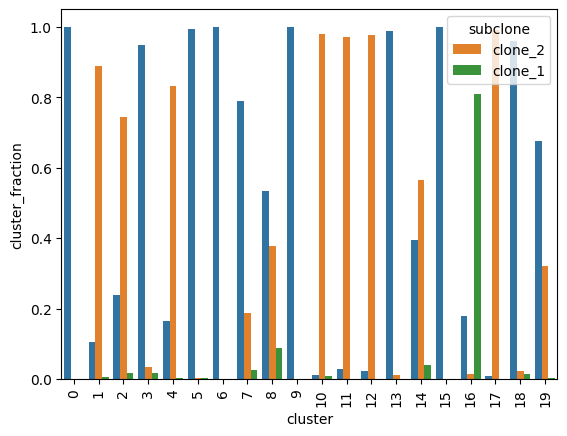

In [44]:
sns.barplot(data=count_df, x='cluster', y='cluster_fraction', hue='subclone')
plt.xticks(rotation=90)

In [123]:
cut = .7
num = 10
clone_to_cluster = {clone:[] for clone in subclone_counts.keys() if clone}
for i, row in count_df.iterrows():
    if row['cluster_fraction'] > cut:
        if row['subclone']:
            clone_to_cluster[row['subclone']].append(row['cluster'])
cluster_to_clone = {v:k for k, vs in clone_to_cluster.items() for v in vs}
tme_cluster_to_orig = [c for c in sorted(set(count_df['cluster']))
                       if tup_counts[('', c)] >= num]
clone_to_cluster, tme_cluster_to_orig

({'clone_2': ['1', '2', '4', '10', '11', '12', '17'], 'clone_1': ['16']},
 ['0',
  '1',
  '10',
  '11',
  '12',
  '13',
  '14',
  '15',
  '16',
  '18',
  '19',
  '2',
  '3',
  '4',
  '5',
  '6',
  '7',
  '8',
  '9'])

In [129]:
def relabel_cluster(cluster, subclone):
    if 'clone' in subclone:
        return subclone
    
    if cluster in cluster_to_clone:
        if tup_counts[('', cluster)] >= num:
            idx = tme_cluster_to_orig.index(cluster)
            return f'TME_{idx}'
        else:
            return 'unlabeled'
    
    idx = tme_cluster_to_orig.index(cluster)
    return f'TME_{idx}'


for section, a in ds.section_to_adata.items():
    a.obs['relabeled_clusters'] = [relabel_cluster(cluster, subclone)
                                   for cluster, subclone in zip(a.obs['cluster'], a.obs['subclone'])]
    

... storing 'relabeled_clusters' as categorical


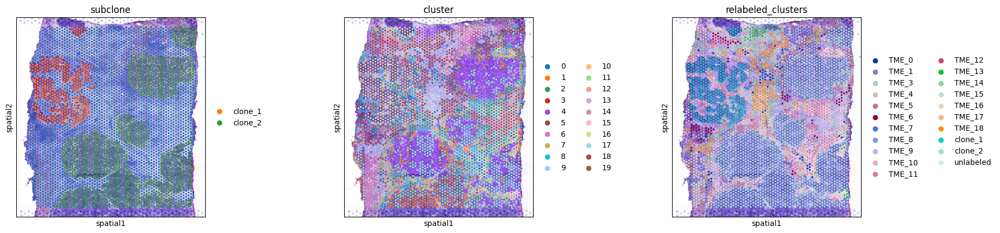

In [130]:
a = ds.section_to_adata['s0']
# a.obs['highlight'] = ['yes' if c=='12' else 'no' for c in a.obs['cluster']]
sc.pl.spatial(a, color=['subclone', 'cluster', 'relabeled_clusters'])

In [158]:
combined = []
for sid, a in ds.section_to_adata.items():
    a.obs['section_id'] = sid
    combined.append(a)
combined = anndata.concat(combined)

# get rid of ribosomal proteins
combined = combined[:, [True if x[:2] != 'RP' else False for x in combined.var.index]]
# sc.pp.normalize_total(combined)
sc.pp.log1p(combined)

combined

/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:372: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


AnnData object with n_obs × n_vars = 21154 × 13290
    obs: 'in_tissue', 'array_row', 'array_col', 'FC1', 'FC2', 'FC3', 'FC4', 'FC5', 'FC6', 'Filtered tumor regions', 'Filtered tumor regions auto', 'Filtered tumor vs. TME', 'Manual annotation', 'Morphologically processed purity', 'Purity', 'TME before boundary', 'TME boundary', 'Tumor before boundary', 'Tumor boundary', 'Tumor regions', 'Tumor vs. TME', 'barcode', 'library_id', 'original', 'sample_id', 'subclone', 'cluster', 'relabeled_clusters', 'section_id', 'highlight', 'macro_cluster'
    uns: 'log1p'
    obsm: 'spatial', 'spatial_scaled'

In [164]:
len(mushroom.learner.channels)

13417

In [165]:
a

AnnData object with n_obs × n_vars = 4123 × 13417
    obs: 'in_tissue', 'array_row', 'array_col', 'FC1', 'FC2', 'FC3', 'FC4', 'FC5', 'FC6', 'Filtered tumor regions', 'Filtered tumor regions auto', 'Filtered tumor vs. TME', 'Manual annotation', 'Morphologically processed purity', 'Purity', 'TME before boundary', 'TME boundary', 'Tumor before boundary', 'Tumor boundary', 'Tumor regions', 'Tumor vs. TME', 'barcode', 'library_id', 'original', 'sample_id', 'subclone', 'cluster', 'relabeled_clusters', 'section_id', 'highlight', 'macro_cluster'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial', 'log1p', 'label_to_barcode', 'barcode_to_label', 'highlight_colors', 'macro_cluster_colors', 'relabeled_clusters_colors', 'spatial_neighbors', 'relabeled_clusters_nhood_enrichment', 'relabeled_clusters_co_occurrence'
    obsm: 'spatial', 'spatial_original', 'spatial_scaled'
    obsp: 'spatial_connectivities', 'spatial_distances'

In [187]:
# pool = []
# for a in ds.section_to_adata.values():
#     pool += a.obs['relabeled_clusters'].to_list()
# pool = sorted(set(pool))

# relabeled_exp = []
# for cluster in pool:
#     f = combined[combined.obs['relabeled_clusters']==cluster]
    
#     # filter out subclones if they are there
    
    
#     x = f.X.mean(0)
#     relabeled_exp.append(x)
# relabeled_exp = np.stack(relabeled_exp)
# relabeled_exp = pd.DataFrame(data=relabeled_exp, columns=combined.var.index.to_list(), index=pool)
# relabeled_exp

In [188]:
relabeled_exp = []
indices = [f'TME_{i}' for i in range(len(tme_cluster_to_orig))]
for i in tme_cluster_to_orig:
    mask = cluster_ids == int(i)
    x = rearrange(mushroom.recon_imgs, 'n d h w -> d n h w')
    relabeled_exp.append(x[:, mask].mean(-1))

for subclone, clusters in clone_to_cluster.items():
    indices.append(subclone)
    
    mask = []
    for i in clusters:
        mask.append(cluster_ids == int(i))
    mask = np.stack(mask).sum(0) > 0
    
    x = rearrange(mushroom.recon_imgs, 'n d h w -> d n h w')
    relabeled_exp.append(x[:, mask].mean(-1))
    
relabeled_exp = torch.stack(relabeled_exp)
relabeled_exp = pd.DataFrame(data=relabeled_exp.numpy(), columns=mushroom.learner.channels, index=indices)
relabeled_exp = relabeled_exp[~pd.isnull(relabeled_exp.iloc[:, 0])]
relabeled_exp


,A1BG,A1BG-AS1,A1CF,A2M,A2ML1,A4GALT,AAAS,AACS,AADAC,AADAT,...,ZUP1,ZW10,ZWILCH,ZWINT,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1
TME_0,1.091797,-0.033615,0.577579,1.784707,-0.425437,0.542569,0.087325,-0.070162,0.979596,-0.052807,...,-0.125453,-0.074953,-0.181182,-0.365154,0.106514,-0.075624,-0.143213,0.190045,0.915113,0.152102
TME_1,-0.089707,0.136006,-0.155456,-0.196950,0.482322,-0.070045,0.203299,0.228908,-0.191505,0.163178,...,0.254084,0.274639,0.344378,0.465942,0.087083,0.275397,0.142704,0.078395,0.240917,0.123096
TME_2,-0.328906,-0.039336,-0.208100,-0.468288,0.300913,-0.135358,-0.046061,0.066646,-0.276540,0.032339,...,0.049443,0.038383,0.142927,0.273987,-0.041691,0.110835,0.043409,-0.092771,-0.204142,-0.036257
TME_3,0.007814,0.281477,-0.186099,-0.195985,1.035577,-0.073228,0.501764,0.487130,-0.244042,0.312495,...,0.504468,0.516905,0.585474,0.773907,0.231841,0.559593,0.301083,0.184780,0.537467,0.270999
TME_4,-0.461804,-0.112335,-0.211343,-0.579283,0.084842,-0.143435,-0.174249,-0.072846,-0.296195,-0.066380,...,-0.074628,-0.107873,-0.043965,0.092270,-0.109628,-0.056696,-0.024141,-0.173472,-0.422152,-0.142678
TME_5,2.013268,0.146182,1.869651,1.593616,-0.019304,0.163197,0.462216,0.106281,2.144154,0.380024,...,0.111824,0.290631,0.028766,0.026286,0.379056,0.192163,0.062428,0.458858,0.810156,0.355504
TME_6,-0.668673,-0.210937,-0.255446,-0.714747,-0.397274,-0.130596,-0.435490,-0.339972,-0.347127,-0.234756,...,-0.313888,-0.353790,-0.339627,-0.389304,-0.206634,-0.358613,-0.155426,-0.289244,-0.769880,-0.297003
TME_7,1.896960,-0.106078,1.074637,1.261422,-0.407776,0.087563,-0.009168,-0.128149,1.598931,0.081788,...,-0.140830,-0.150293,-0.270985,-0.351655,0.006004,-0.130470,-0.113768,0.028388,0.218404,0.022661
TME_8,-0.125615,0.435887,-0.244738,0.305404,-0.306464,0.108321,0.803467,0.988046,-0.342757,0.474579,...,0.378946,0.605609,0.928074,0.748987,0.375714,0.329307,0.510020,0.543203,0.360772,0.379409
TME_9,-0.404851,-0.143488,-0.210608,-0.319835,-0.444557,-0.035192,-0.352573,-0.312019,-0.293287,-0.228454,...,-0.288269,-0.331977,-0.335440,-0.446943,-0.178802,-0.346478,-0.166471,-0.219882,-0.464180,-0.214380


In [189]:
# relabeled_frac = []
# indices = [f'TME_{i}' for i in range(len(tme_cluster_to_orig))]
# for i in tme_cluster_to_orig:
#     mask = cluster_ids == int(i)
#     x = rearrange(mushroom.recon_imgs, 'n d h w -> d n h w')
#     relabeled_frac.append((x[:, mask] > 0).sum(-1) / x[:, mask].shape[0])

# for subclone, clusters in clone_to_cluster.items():
#     indices.append(subclone)
    
#     mask = []
#     for i in clusters:
#         mask.append(cluster_ids == int(i))
#     mask = np.stack(mask).sum(0) > 0
    
#     x = rearrange(mushroom.recon_imgs, 'n d h w -> d n h w')
#     relabeled_frac.append((x[:, mask] > 0).sum(-1) / x[:, mask].shape[0])
    
# relabeled_frac = torch.stack(relabeled_frac)
# relabeled_frac = pd.DataFrame(data=relabeled_frac.numpy(), columns=mushroom.learner.channels, index=indices)
# relabeled_frac = relabeled_frac[~pd.isnull(relabeled_frac.iloc[:, 0])]
# relabeled_frac


In [855]:
data = []

clusters = sorted(set([v for a in ds.section_to_adata.values() for v in a.obs['relabeled_clusters']]))
for section in ds.sections:
    a = ds.section_to_adata[section]
    counts = Counter(a.obs['relabeled_clusters'])
    for cluster in clusters:
        data.append([cluster, section, counts.get(cluster, 0), counts.get(cluster, 0) / a.shape[0]])
df = pd.DataFrame(data, columns=['cluster', 'section', 'count', 'spot_fraction'])
df 

,cluster,section,count,spot_fraction
0,TME_0,s0,59,0.013932
1,TME_1,s0,64,0.015112
2,TME_10,s0,52,0.012279
3,TME_11,s0,308,0.072727
4,TME_12,s0,23,0.005431
...,...,...,...,...
105,TME_8,s4,0,0.000000
106,TME_9,s4,196,0.047538
107,clone_1,s4,46,0.011157
108,clone_2,s4,2327,0.564395


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:FFTM dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 25 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'a', 'c', 'e', 'f', 'five', 'four', 'i', 'l', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'two', 'u', 'underscore', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 22, 23, 24, 66, 68, 70, 72, 73, 76, 79, 81, 82, 83, 85, 86, 87, 88]
INFO:fontTools.subset:Closed glyph list over 'GSUB': 30 glyphs after
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'a', 'c', 'e', 'f', 'fi', 'five', 'fl', 'four', 'i', 'l', 'n', 'nonmarkingretu

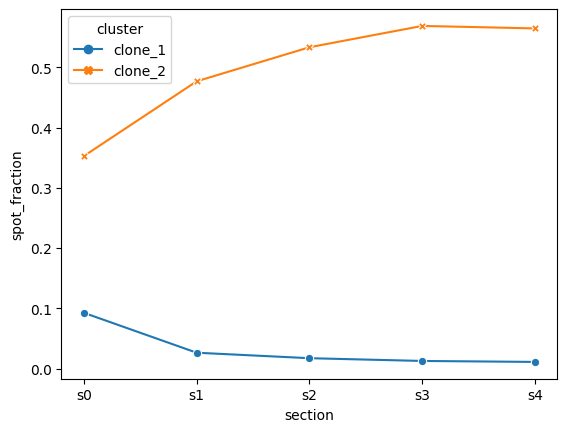

In [858]:
f = df[[True if 'clone' in c else False for c in df['cluster']]]
sns.lineplot(data=f, x='section', y='spot_fraction', hue='cluster', style="cluster", dashes=False, markers=True)
plt.savefig(os.path.join(out_dir, 'clone_change_ht268.pdf'))

/tmp/ipykernel_164073/2014638585.py:2: UserWarning: The palette list has more values (20) than needed (19), which may not be intended.
  sns.lineplot(data=f, x='section', y='spot_fraction', hue='cluster',


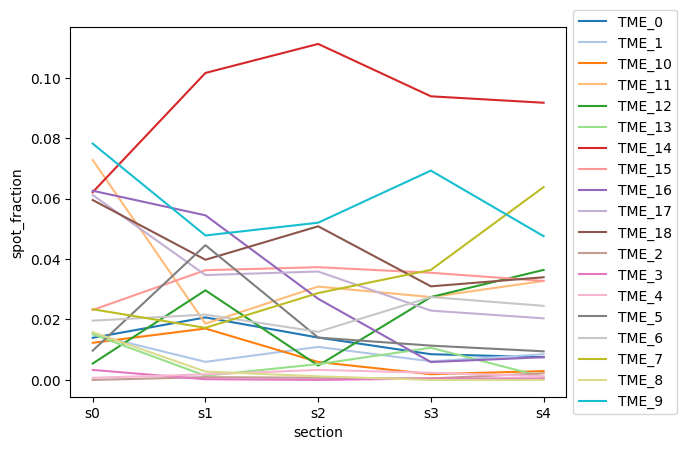

In [857]:
f = df[[True if 'TME' in c else False for c in df['cluster']]]
sns.lineplot(data=f, x='section', y='spot_fraction', hue='cluster',
             palette=sns.color_palette('tab20'))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

In [193]:
import anndata

In [194]:
combined = []
for sid, a in ds.section_to_adata.items():
    a.obs['section_id'] = sid
    combined.append(a)
combined = anndata.concat(combined)
# combined = ds.section_to_adata['s0'].copy()

# get rid of ribosomal proteins
combined = combined[:, [True if x[:2] != 'RP' else False for x in combined.var.index]]
# sc.pp.normalize_total(combined)
sc.pp.log1p(combined)

combined

/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:372: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


AnnData object with n_obs × n_vars = 21154 × 13290
    obs: 'in_tissue', 'array_row', 'array_col', 'FC1', 'FC2', 'FC3', 'FC4', 'FC5', 'FC6', 'Filtered tumor regions', 'Filtered tumor regions auto', 'Filtered tumor vs. TME', 'Manual annotation', 'Morphologically processed purity', 'Purity', 'TME before boundary', 'TME boundary', 'Tumor before boundary', 'Tumor boundary', 'Tumor regions', 'Tumor vs. TME', 'barcode', 'library_id', 'original', 'sample_id', 'subclone', 'cluster', 'relabeled_clusters', 'section_id', 'highlight', 'macro_cluster'
    uns: 'log1p'
    obsm: 'spatial', 'spatial_scaled'

In [195]:
sc.tl.rank_genes_groups(combined, 'relabeled_clusters', method='wilcoxon')
# # 'logreg', 't-test', 'wilcoxon', 't-test_overestim_var'

... storing 'barcode' as categorical
... storing 'section_id' as categorical
/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:398: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/data/estorrs/miniconda3/env

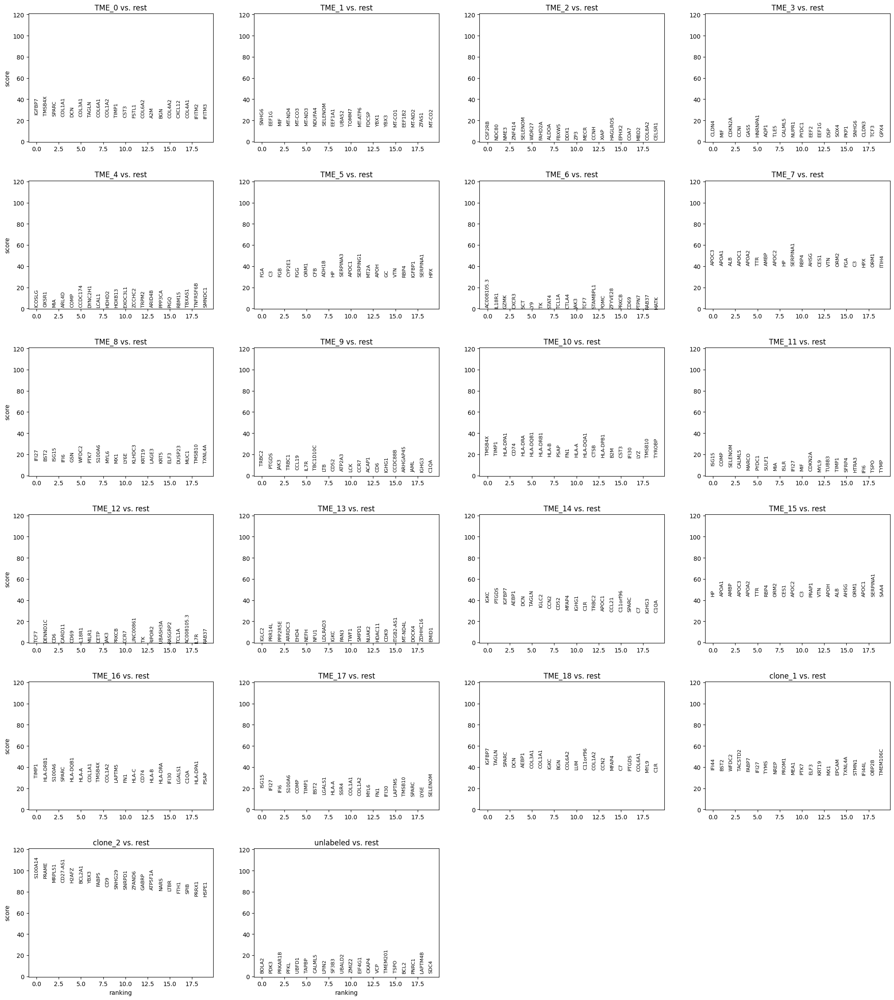

In [196]:
sc.pl.rank_genes_groups(combined)

         Falling back to preprocessing with `sc.pp.pca` and default params.
categories: TME_0, TME_1, TME_2, etc.
var_group_labels: TME_0


/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


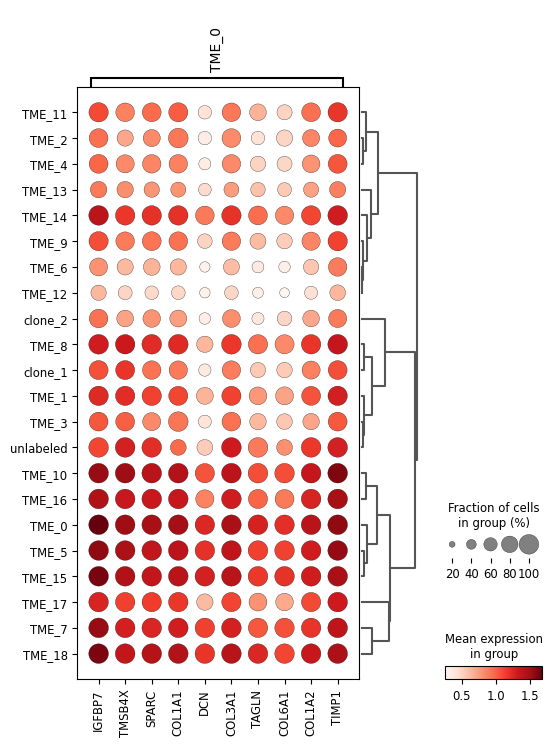

In [197]:
sc.pl.rank_genes_groups_dotplot(combined, groups=['TME_0'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


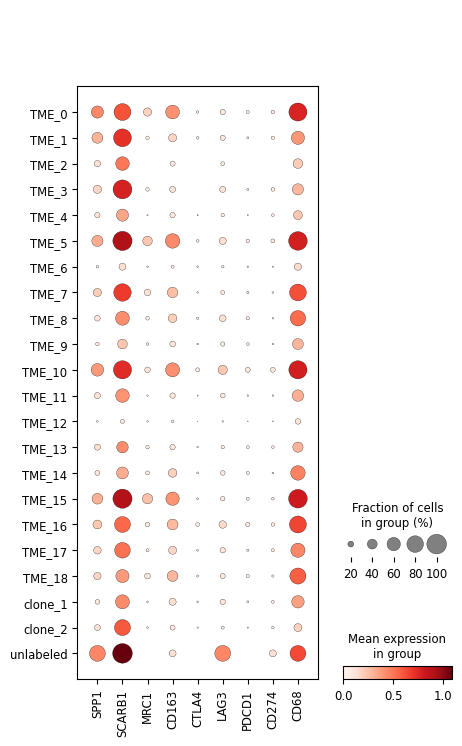

In [198]:

## ChIP assays indicate that c-MYC directly regulates some genes associated with alternative activation, including SCARB1, ALOX15, and MRC1, whereas others, including CD209, are indirectly regulated by c-MYC


genes = ['SPP1', 'SCARB1', 'MRC1', 'CD163', 'CTLA4', 'LAG3', 'PDCD1', 'CD274', 'CD68']
sc.pl.dotplot(combined, groupby='relabeled_clusters', var_names=genes)

In [870]:
def plot_change(clusters, column='relabeled_clusters', alpha_img=.5, size=2., figsize=(5, 5)):
    if isinstance(clusters, str):
        clusters = [clusters]
    fig, axs = plt.subplots(ncols=len(ds.sections), nrows=len(clusters), figsize=figsize)
    for i, section in enumerate(ds.sections):
        for j, cluster in enumerate(clusters):
            a = ds.section_to_adata[section]
            ax = axs[j, i] if len(clusters) > 1 else axs[i]

            a.obs['highlight'] = ['yes' if c==cluster else 'no' for c in a.obs[column]]
            a.obs['highlight'] = a.obs['highlight'].astype('category')
            d = next(iter(a.uns['spatial'].values()))
            scale = d['scalefactors']['tissue_hires_scalef']
            h, w = int(d['images']['hires'].shape[0] / scale), int(d['images']['hires'].shape[1] / scale)
            sc.pl.spatial(a, color=['highlight'], ax=ax, show=False, alpha_img=alpha_img, legend_loc=None,
                         size=size, crop_coord=(0, w, 0, h))
            ax.set_xlabel('')
            ax.set_ylabel('')
            ax.set_title('')
            
            if j == 0:
                ax.set_title(section)
            
            if i == 0:
                ax.set_ylabel(cluster)
        
def plot_change_vars(vars, colorbar_loc=None, alpha_img=.5, size=2., figsize=(5, 5)):
    if isinstance(vars, str):
        vars = [vars]
    fig, axs = plt.subplots(ncols=len(ds.sections), nrows=len(vars), figsize=figsize)
    for i, section in enumerate(ds.sections):
        for j, var in enumerate(vars):
            a = ds.section_to_adata[section]
            ax = axs[j, i] if len(vars) > 1 else axs[i]
            d = next(iter(a.uns['spatial'].values()))
            scale = d['scalefactors']['tissue_hires_scalef']
            h, w = int(d['images']['hires'].shape[0] / scale), int(d['images']['hires'].shape[1] / scale)
            sc.pl.spatial(a, color=[var], ax=ax, show=False, alpha_img=alpha_img,
                          legend_loc=None, colorbar_loc=colorbar_loc, crop_coord=(0, w, 0, h),
                         size=size)
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_xlabel('')
            ax.set_ylabel('')
            ax.set_title('')
            
            if j == 0:
                ax.set_title(section)
            
            if i == 0:
                ax.set_ylabel(var)

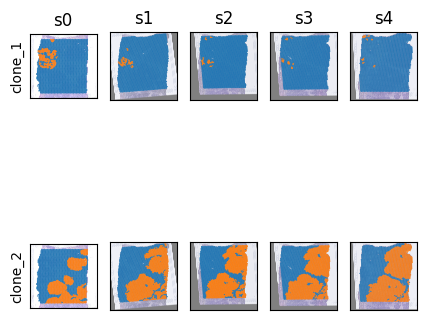

In [864]:
plot_change(['clone_1', 'clone_2'])

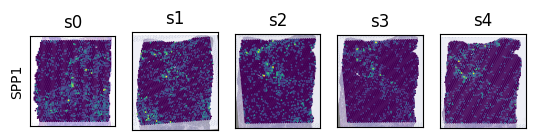

In [201]:
plot_change_vars('SPP1')

In [202]:
relabeled_exp.sort_values('SPP1', ascending=False)[['SPP1']]

,SPP1
TME_0,0.940263
TME_10,0.798846
TME_5,0.718314
TME_15,0.507531
TME_16,0.295544
TME_7,0.260639
TME_3,0.221042
TME_18,0.172656
TME_1,0.107866
TME_17,0.057081


In [203]:
relabeled_exp.sort_values('CCL15', ascending=False)[['CCL15']]

,CCL15
TME_15,1.725750
TME_5,1.295831
TME_7,0.778111
TME_0,0.442297
TME_10,0.163341
TME_18,0.037696
TME_14,-0.004785
TME_16,-0.082372
TME_1,-0.111930
TME_17,-0.112269


In [569]:
# def get_delta(cluster, df, n=20):
#     idxs = np.flip(macro_exp.loc[cluster].argsort())
#     genes = macro_exp.columns[idxs][:n]
#     return genes

def get_delta(cluster, df, n=20):
    target = df[[True if c==cluster else False for c in df.index.to_list()]]
    
#     index = df.shape[0] // 2 # median
#     val_idxs = np.argsort(df.values, axis=0)[-index]
#     median_vals = np.asarray([df.iloc[x, g] for x, g in zip(val_idxs, range(len(df.columns)))])
    
    index = 2 # second
    val_idxs = np.argsort(df.values, axis=0)[-index]
    second_vals = np.asarray([df.iloc[x, g] for x, g in zip(val_idxs, range(len(df.columns)))])
    
#     vals = (median_vals + second_vals) / 2
    vals = second_vals

    deltas = target - vals
    idxs = np.flip(deltas.iloc[0].argsort())
    genes = df.columns[idxs][:n]
    return genes

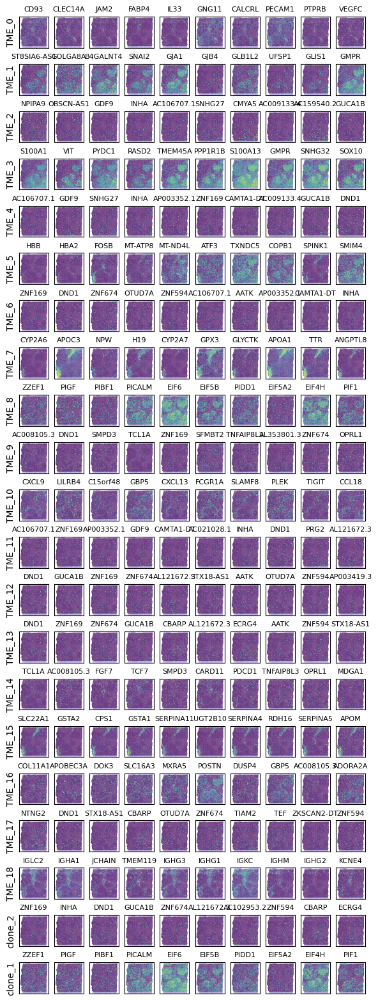

In [614]:
n = 10
a = ds.section_to_adata['s0']
fig, axs = plt.subplots(nrows=relabeled_exp.shape[0], ncols=n, figsize=(7, 20))
for r, cluster in enumerate(relabeled_exp.index.to_list()):
    genes = get_delta(cluster, relabeled_exp, n=n)
    for c, gene in enumerate(genes):
        ax = axs[r, c]
        sc.pl.spatial(a, color=gene, ax=ax, show=False, alpha_img=.5, legend_loc=None,
                      size=1.5, title='', colorbar_loc=None)
        
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.set_title(gene, fontsize=8)

        if c == 0:
            ax.set_ylabel(cluster)
        
    
    

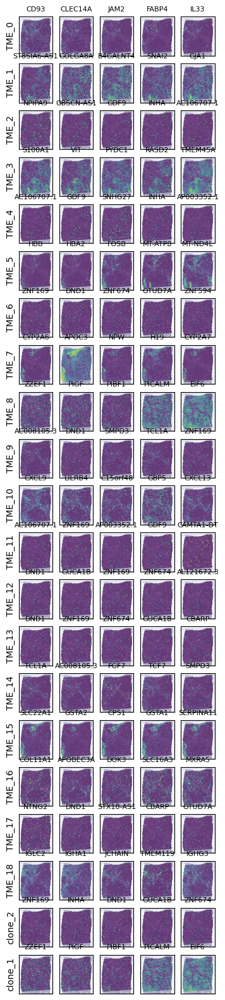

In [571]:
n = 5
a = ds.section_to_adata['s1']
fig, axs = plt.subplots(nrows=relabeled_exp.shape[0], ncols=n, figsize=(4, 20))
for r, cluster in enumerate(relabeled_exp.index.to_list()):
    genes = get_delta(cluster, relabeled_exp, n=n)
    for c, gene in enumerate(genes):
        ax = axs[r, c]
        sc.pl.spatial(a, color=gene, ax=ax, show=False, alpha_img=.5, legend_loc=None,
                      size=1.5, title='', colorbar_loc=None)
        
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.set_title(gene, fontsize=8)

        if c == 0:
            ax.set_ylabel(cluster)
        
    
    

In [572]:
# TME 5 == clone 2
# TME 10 == clone 2

In [620]:
degs = []
n = 20
c2g = {}
for r, cluster in enumerate(relabeled_exp.index.to_list()):
    genes = get_delta(cluster, relabeled_exp, n=n)
    c2g[cluster] = genes.tolist()
    degs += genes.tolist()
degs = sorted(set(degs))

deg_exp = relabeled_exp[degs]
deg_exp

,AATK,AC005674.2,AC008105.3,AC009133.4,AC010531.6,AC011330.2,AC021028.1,AC021087.4,AC090772.3,AC091153.3,...,UGT2B10,UGT8,VEGFC,VIT,WARS,ZKSCAN2-DT,ZNF169,ZNF594,ZNF674,ZZEF1
TME_0,0.091282,0.159633,0.187581,-0.088103,-0.106680,-0.045847,-0.117366,-0.133806,-0.098688,-0.092951,...,0.383060,-0.202205,1.032833,-0.415279,0.317333,-0.047907,-0.004391,-0.011824,-0.036255,0.152102
TME_1,0.086732,0.061292,-0.079459,0.122677,0.124014,0.105898,0.107753,0.134656,0.149854,0.112183,...,-0.172654,0.290626,-0.043611,0.639486,0.321691,0.106617,0.094764,0.094092,0.085766,0.123096
TME_2,0.033283,0.009914,-0.125196,0.103864,0.052601,0.049876,0.073636,0.091907,0.105252,0.052727,...,-0.213195,0.078180,-0.137602,0.374581,-0.158178,0.009777,0.047670,0.064136,0.025719,-0.036257
TME_3,0.195100,0.095248,-0.092763,0.293263,0.173234,0.306321,0.224920,0.212676,0.289449,0.203734,...,-0.208374,0.549056,-0.018839,1.287042,0.571456,0.182841,0.200535,0.188672,0.224651,0.270999
TME_4,0.004341,-0.012709,-0.145883,0.041243,-0.008681,-0.017383,0.013367,0.036629,0.055742,0.002511,...,-0.230570,-0.037248,-0.182091,0.070662,-0.392540,-0.014853,0.019023,-0.003744,-0.031049,-0.142678
TME_5,0.075702,0.059822,0.164997,-0.007854,0.014762,0.064956,0.073737,0.002980,-0.012506,-0.023939,...,2.002504,-0.065808,0.349716,-0.043444,0.741836,0.072369,0.001485,0.041027,0.040287,0.355504
TME_6,-0.119353,-0.107208,-0.087737,-0.137157,-0.108662,-0.132599,-0.121133,-0.134440,-0.101799,-0.108940,...,-0.266093,-0.253674,-0.210191,-0.471889,-0.762304,-0.101775,-0.106945,-0.129756,-0.121737,-0.297003
TME_7,-0.091309,-0.043007,-0.033760,-0.120360,-0.038189,-0.051652,-0.091655,-0.127197,-0.114416,-0.083764,...,1.302164,-0.219204,0.137597,-0.428755,-0.133049,-0.047872,-0.075853,-0.056974,-0.097143,0.022661
TME_8,-0.016052,0.070198,0.064364,-0.047398,0.095994,0.046953,0.048080,-0.037919,0.103164,0.117270,...,-0.231864,0.201336,-0.002467,-0.364452,0.614557,0.076131,0.096326,0.039955,0.073351,0.379409
TME_9,-0.102661,-0.084227,0.135709,-0.136305,-0.112966,-0.121504,-0.108461,-0.158448,-0.142108,-0.115032,...,-0.226421,-0.243908,-0.126338,-0.504414,-0.504281,-0.105897,-0.083833,-0.121052,-0.118294,-0.214380


In [623]:
for g in c2g['TME_16']: print(g)

COL11A1
APOBEC3A
DOK3
SLC16A3
MXRA5
POSTN
DUSP4
GBP5
AC008105.3
ADORA2A
TRAF1
GNLY
TNFSF13B
ADAM12
CD38
LAG3
AC147651.4
GZMB
CIITA
PLA2G2D


In [622]:
for g in c2g['TME_10']: print(g)

CXCL9
LILRB4
C15orf48
GBP5
CXCL13
FCGR1A
SLAMF8
PLEK
TIGIT
CCL18
IL2RG
OLR1
WARS
SLAMF7
IDO1
SIGLEC10
IRF8
CIITA
RASSF4
TNFSF13B


In [626]:
from sklearn.cluster import AgglomerativeClustering
dist = 8.
f = deg_exp.loc[[c for c in deg_exp.index.to_list() if 'TME' in c]]
clustering = AgglomerativeClustering(n_clusters=None, distance_threshold=dist).fit(f.values)

cluster_to_label = {c:l for c, l in zip(deg_exp.index, clustering.labels_)}

In [627]:
pool = []
for section, a in ds.section_to_adata.items():
    a.obs['macro_cluster'] = [f'TME_NBHD_{cluster_to_label[c]}' if c in cluster_to_label else c
                              for c in a.obs['relabeled_clusters']]
    a.obs['macro_cluster'] = a.obs['macro_cluster'].astype("category")
    pool += a.obs['macro_cluster'].to_list()

pool = sorted(set(pool))
print(pool)
cmap = {x:color for x, color in zip(sorted(pool), sns.color_palette('tab20'))}
for section, a in ds.section_to_adata.items():
    a.uns['macro_cluster_colors'] = [cmap[x] for x in a.obs['macro_cluster'].cat.categories]
    ds.section_to_adata[section] = a

['TME_NBHD_0', 'TME_NBHD_1', 'TME_NBHD_2', 'TME_NBHD_3', 'TME_NBHD_4', 'TME_NBHD_5', 'TME_NBHD_6', 'clone_1', 'clone_2', 'unlabeled']


(array([  5,  15,  25,  35,  45,  55,  65,  75,  85,  95, 105, 115, 125,
        135, 145, 155, 165, 175, 185]),
 [Text(5, 0, 'TME_15'),
  Text(15, 0, 'TME_5'),
  Text(25, 0, 'TME_7'),
  Text(35, 0, 'TME_9'),
  Text(45, 0, 'TME_14'),
  Text(55, 0, 'TME_4'),
  Text(65, 0, 'TME_11'),
  Text(75, 0, 'TME_6'),
  Text(85, 0, 'TME_12'),
  Text(95, 0, 'TME_13'),
  Text(105, 0, 'TME_0'),
  Text(115, 0, 'TME_18'),
  Text(125, 0, 'TME_3'),
  Text(135, 0, 'TME_1'),
  Text(145, 0, 'TME_2'),
  Text(155, 0, 'TME_10'),
  Text(165, 0, 'TME_8'),
  Text(175, 0, 'TME_16'),
  Text(185, 0, 'TME_17')])

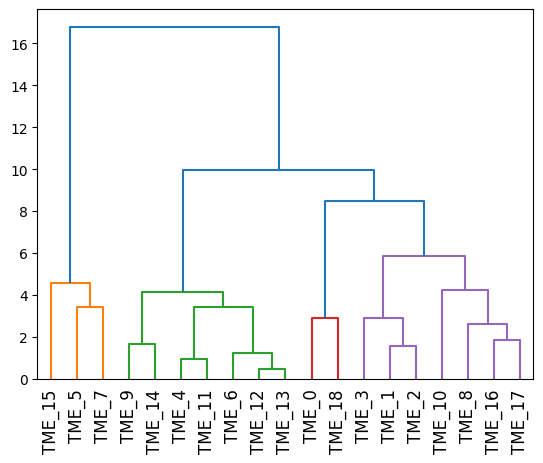

In [612]:
import scipy.cluster.hierarchy as shc
links = shc.linkage(f.values, method ='ward')
dendrogram = shc.dendrogram((links), color_threshold=dist, labels=f.index.to_list())
plt.xticks(rotation=90)

In [629]:
pool = []
for section, a in ds.section_to_adata.items():
    a.obs['macro_cluster'] = [c for c in a.obs['relabeled_clusters']]
    a.obs['macro_cluster'] = a.obs['macro_cluster'].astype("category")
    pool += a.obs['macro_cluster'].to_list()

pool = sorted(set(pool))
pal = sns.color_palette('tab20') + sns.color_palette('tab20b')
cmap = {x:color for x, color in zip(sorted(pool), pal)}
for section, a in ds.section_to_adata.items():
    a.uns['macro_cluster_colors'] = [cmap[x] for x in a.obs['macro_cluster'].cat.categories]
    ds.section_to_adata[section] = a

In [630]:
# # being lazy and reseting macro cluster to original so you don't have to rewrite the back half of the notebook
# for section, a in ds.section_to_adata.items():
#     a.obs['macro_cluster'] = a.obs['relabeled_clusters'].to_list()
#     ds.section_to_adata[section] = a

/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1100: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter([], [], c=palette[label], label=label)


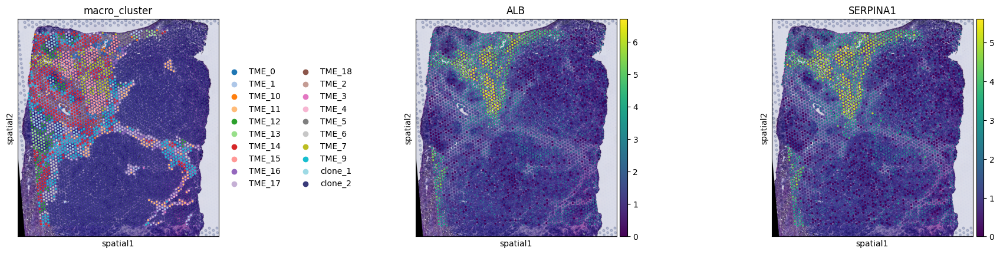

In [809]:
a = ds.section_to_adata['s3']
sc.pl.spatial(a, color=['macro_cluster', 'ALB', 'SERPINA1'])

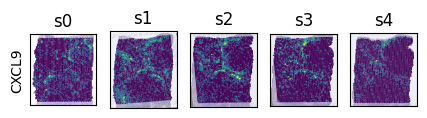

In [632]:
plot_change_vars(['CXCL9'])

In [873]:
len(mushroom.learner.channels)

13417

In [633]:
pool = relabeled_exp.index.to_list()
pool += ['unlabeled']

palette = sns.color_palette('tab20')
palette += sns.color_palette('tab20b')
cmap = {x:color for x, color in zip(sorted(pool), palette)}
for section, a in ds.section_to_adata.items():
    a.obs['relabeled_clusters'] = a.obs['relabeled_clusters'].astype('category')
    a.uns['relabeled_clusters_colors'] = [cmap[x] for x in a.obs['relabeled_clusters'].cat.categories]
    ds.section_to_adata[section] = a

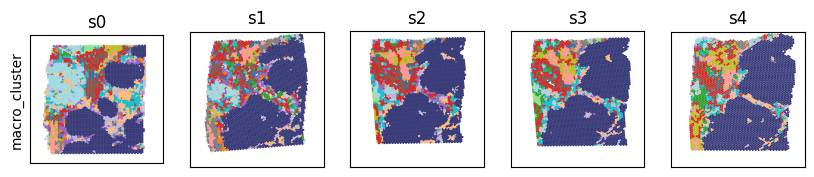

In [872]:
plot_change_vars(['macro_cluster'], alpha_img=0., figsize=(10, 2))
plt.savefig(os.path.join(out_dir, 'macro_clusters.png'), dpi=300)

/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1100: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter([], [], c=palette[label], label=label)
INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:FFTM dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 31 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'E', '

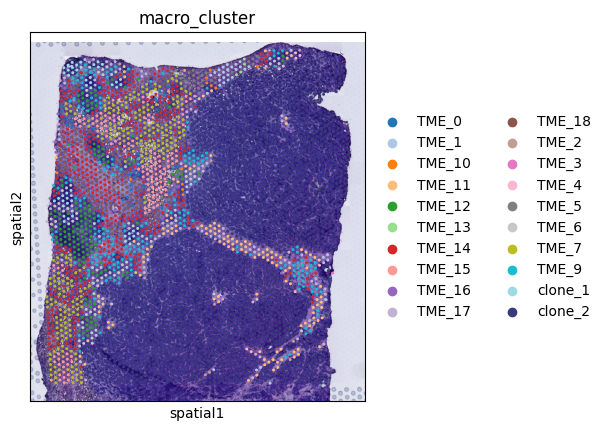

In [866]:
sc.pl.spatial(a, color='macro_cluster', save='macro_cluster_legend.pdf')

/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1100: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter([], [], c=palette[label], label=label)
/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1100: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter([], [], c=palette[label], label=label)


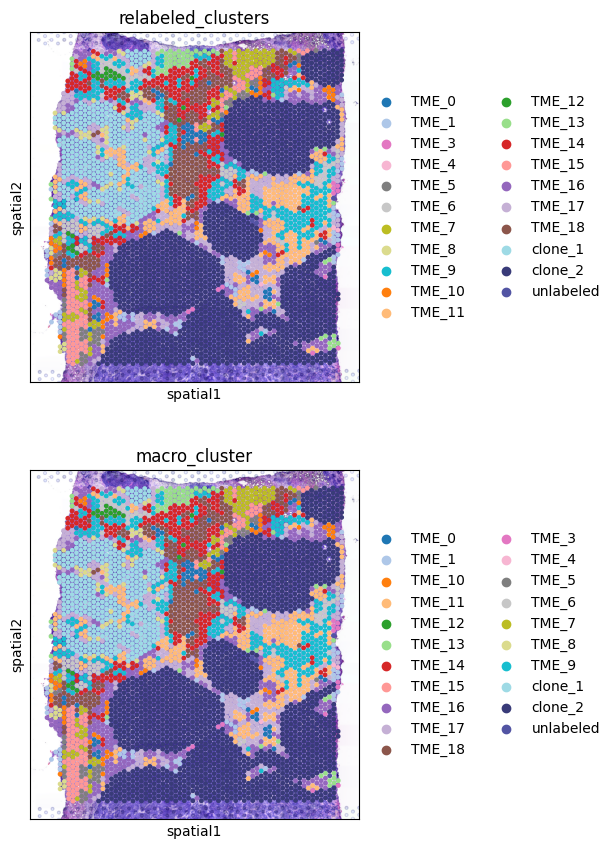

In [634]:
a = ds.section_to_adata['s0']
sc.pl.spatial(a, color=['relabeled_clusters', 'macro_cluster'], size=1.5, ncols=1)

/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1100: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter([], [], c=palette[label], label=label)
/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1100: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter([], [], c=palette[label], label=label)


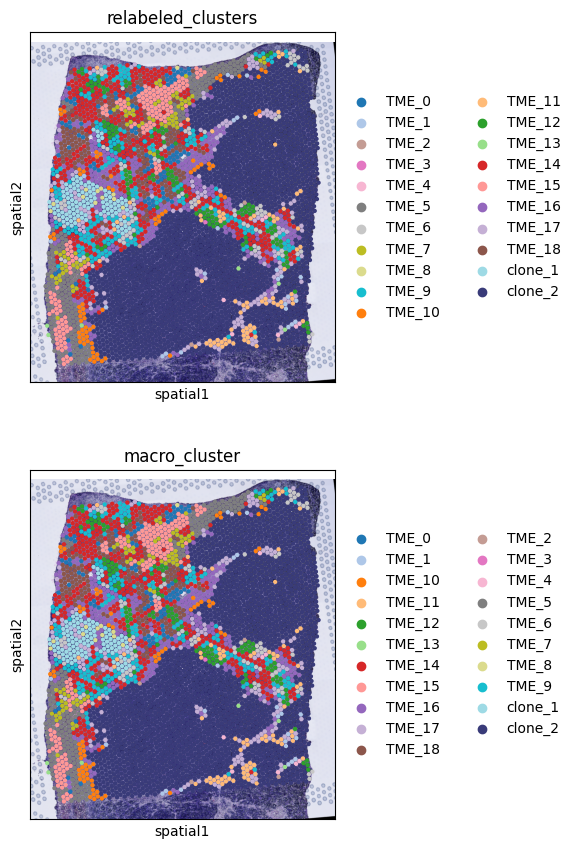

In [635]:
a = ds.section_to_adata['s1']
sc.pl.spatial(a, color=['relabeled_clusters', 'macro_cluster'], size=1.5, ncols=1)

/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1100: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter([], [], c=palette[label], label=label)
/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1100: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter([], [], c=palette[label], label=label)


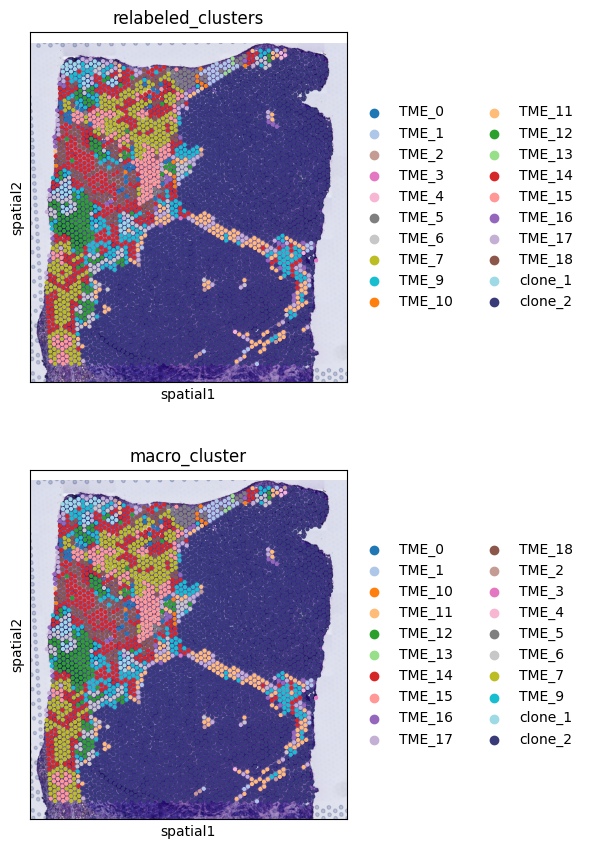

In [636]:
a = ds.section_to_adata['s4']
sc.pl.spatial(a, color=['relabeled_clusters', 'macro_cluster'], size=1.5, ncols=1)

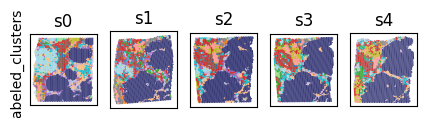

In [637]:
plot_change_vars(['relabeled_clusters'], alpha_img=0.)

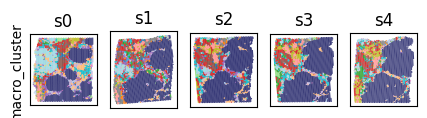

In [638]:
plot_change_vars(['macro_cluster'], alpha_img=0.)

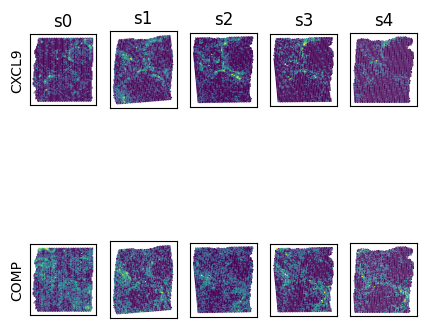

In [639]:
plot_change_vars(['CXCL9', 'COMP'], alpha_img=0.)

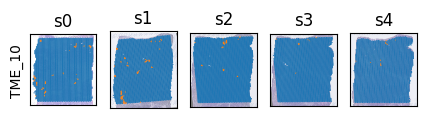

In [640]:
plot_change(['TME_10'])

In [641]:
macro_to_cluster_idxs = {}
for a in ds.section_to_adata.values():
    for cluster, macro in zip(a.obs['cluster'], a.obs['macro_cluster']):
        if macro not in macro_to_cluster_idxs:
            macro_to_cluster_idxs[macro] = []
        
        if cluster not in macro_to_cluster_idxs[macro]:
            macro_to_cluster_idxs[macro].append(cluster)
            
macro_exp = []
indices = []
for macro, clusters in macro_to_cluster_idxs.items():
    indices.append(macro)
    
    mask = []
    for i in clusters:
        mask.append(cluster_ids == int(i))
    mask = np.stack(mask).sum(0) > 0
    
    x = rearrange(mushroom.recon_imgs, 'n d h w -> d n h w')
    macro_exp.append(x[:, mask].mean(-1))
    
macro_exp = torch.stack(macro_exp)
macro_exp = pd.DataFrame(data=macro_exp.numpy(), columns=mushroom.learner.channels, index=indices)
macro_exp = macro_exp[~pd.isnull(macro_exp.iloc[:, 0])]
macro_exp

,A1BG,A1BG-AS1,A1CF,A2M,A2ML1,A4GALT,AAAS,AACS,AADAC,AADAT,...,ZUP1,ZW10,ZWILCH,ZWINT,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1
TME_17,-0.171144,0.020450,-0.155780,-0.037497,-0.098657,0.003056,-0.018566,-0.006785,-0.219408,-0.046717,...,-0.036729,-0.010345,-0.019668,-0.068122,-0.028308,-0.061091,0.003272,0.007030,0.016730,-0.027332
TME_16,-0.007424,0.092009,-0.132147,0.465199,-0.073894,0.183280,0.148506,0.052496,-0.130520,-0.049174,...,0.040747,0.089339,-0.028700,-0.107920,0.006476,0.028466,0.005466,0.127178,0.495945,0.137029
TME_14,0.090059,-0.081544,-0.086287,0.241320,-0.448311,0.069351,-0.246047,-0.255162,-0.075257,-0.182546,...,-0.241558,-0.281331,-0.311543,-0.425768,-0.131251,-0.284368,-0.155057,-0.127614,-0.129013,-0.117949
TME_15,2.750080,-0.009029,2.255470,1.895546,-0.364796,0.110972,0.273956,-0.053049,3.065821,0.373495,...,-0.065630,0.008796,-0.188584,-0.293357,0.298827,0.105788,-0.012367,0.386394,0.583185,0.241062
clone_2,-0.499533,-0.113918,-0.204169,-0.533402,-0.206188,-0.104003,-0.256105,-0.187012,-0.269724,-0.134583,...,-0.166531,-0.186107,-0.173970,-0.230979,-0.119215,-0.202934,-0.087758,-0.170022,-0.484955,-0.194295
TME_0,1.091797,-0.033615,0.577579,1.784707,-0.425437,0.542569,0.087325,-0.070162,0.979596,-0.052807,...,-0.125453,-0.074953,-0.181182,-0.365154,0.106514,-0.075624,-0.143213,0.190045,0.915113,0.152102
TME_18,0.382288,-0.016123,-0.006736,1.029112,-0.455466,0.437437,-0.120497,-0.151916,0.100671,-0.162687,...,-0.253456,-0.229883,-0.307557,-0.446070,-0.078474,-0.207759,-0.164076,0.002834,0.405762,0.008629
TME_11,-0.523620,-0.129364,-0.225920,-0.592379,-0.143498,-0.123218,-0.270652,-0.203187,-0.309861,-0.143249,...,-0.176380,-0.219390,-0.193714,-0.136531,-0.142148,-0.201396,-0.082744,-0.205232,-0.523609,-0.198575
TME_5,2.013268,0.146182,1.869651,1.593616,-0.019304,0.163197,0.462216,0.106281,2.144154,0.380024,...,0.111824,0.290631,0.028766,0.026286,0.379056,0.192163,0.062428,0.458858,0.810156,0.355504
TME_9,-0.404851,-0.143488,-0.210608,-0.319835,-0.444557,-0.035192,-0.352573,-0.312019,-0.293287,-0.228454,...,-0.288269,-0.331977,-0.335440,-0.446943,-0.178802,-0.346478,-0.166471,-0.219882,-0.464180,-0.214380


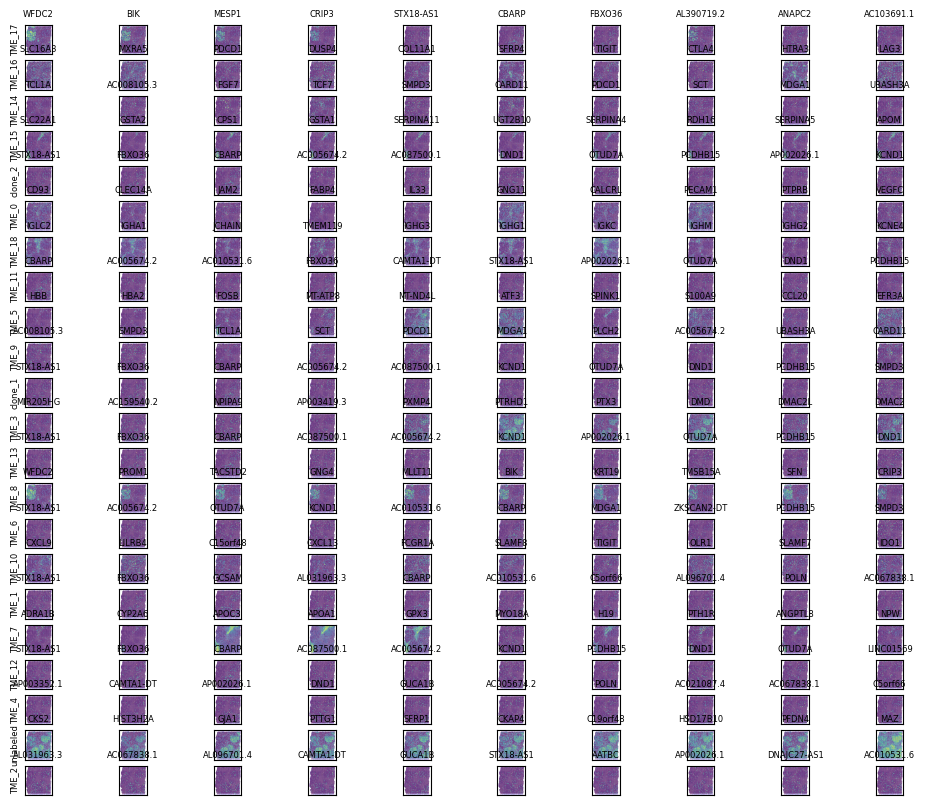

In [642]:
n = 10
a = ds.section_to_adata['s0']
fig, axs = plt.subplots(nrows=macro_exp.shape[0], ncols=n, figsize=(12, 10))
c2g = {}
for r, cluster in enumerate(macro_exp.index.to_list()):
    genes = get_delta(cluster, macro_exp, n=n)
    c2g[cluster] = genes
    for c, gene in enumerate(genes):
        ax = axs[r, c]
        sc.pl.spatial(a, color=gene, ax=ax, show=False, alpha_img=.5, legend_loc=None,
                      size=1.5, title='', colorbar_loc=None)
        
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.set_title(gene, fontsize=6)

        if c == 0:
            ax.set_ylabel(cluster, fontsize=6)
        
    
    

In [853]:
for g in c2g['TME_10']: print(g)

CXCL9
LILRB4
C15orf48
CXCL13
FCGR1A
SLAMF8
TIGIT
OLR1
SLAMF7
IDO1


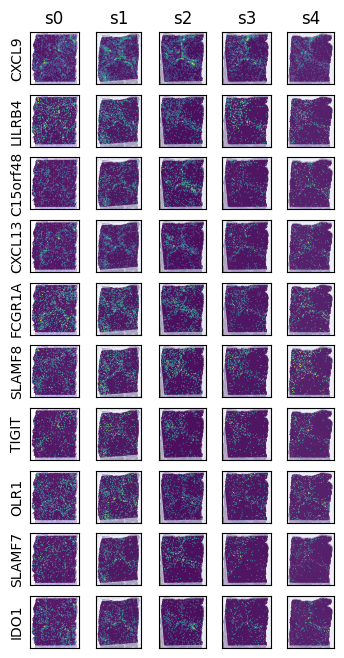

In [851]:
plot_change_vars(c2g['TME_10'], figsize=(4, 8))
plt.savefig(os.path.join(out_dir, 'tme_10.png'))

In [854]:
for g in c2g['TME_16']: print(g)

SLC16A3
MXRA5
PDCD1
DUSP4
COL11A1
SFRP4
TIGIT
CTLA4
HTRA3
LAG3


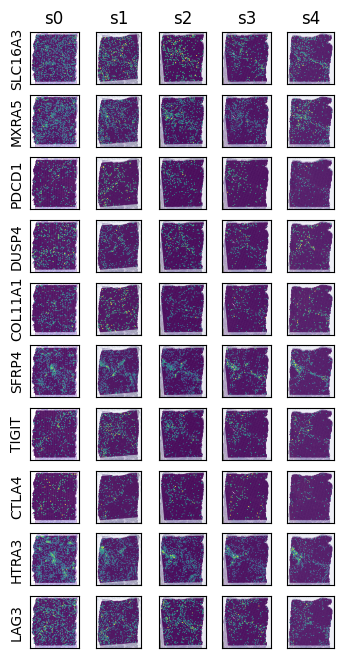

In [852]:
plot_change_vars(c2g['TME_16'], figsize=(4, 8))
plt.savefig(os.path.join(out_dir, 'tme_16.png'))

INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:FFTM dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 21 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'G', 'I', 'L', 'O', 'P', 'T', 'X', 'four', 'nine', 'nonmarkingreturn', 'one', 's', 'space', 'three', 'two', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 28, 36, 38, 39, 42, 44, 47, 50, 51, 55, 59, 86]
INFO:fontTools.subset:Closed glyph list over 'GSUB': 21 glyphs after
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'G', 'I', 'L', 'O', 'P', 'T', 'X', 'four', 'nine', 'nonmarkingreturn', 'one', 's', 'space', 'three', 'two', 'zero

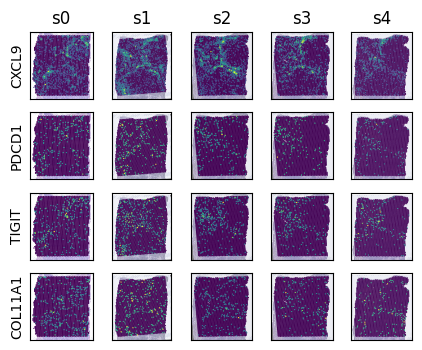

In [847]:
plot_change_vars(['CXCL9', 'PDCD1', 'TIGIT', 'COL11A1'], figsize=(5, 4))
plt.savefig('/data/estorrs/mushroom/data/projects/subclone/mushroom/HT268B1_vae_vq/outputs/selected_plots.pdf')

In [650]:
# % contact
cluster_to_macro_cluster = {}
for a in ds.section_to_adata.values():
    for cluster, r_cluster, subclone in zip(a.obs['cluster'], a.obs['macro_cluster'], a.obs['subclone']):
        if 'clone' not in subclone:
            cluster_to_macro_cluster[int(cluster)] = r_cluster

macro_ids = cluster_ids.copy().astype(object)
vf = np.vectorize(cluster_to_macro_cluster.get)
macro_ids = vf(macro_ids)

for i, section in enumerate(ds.sections):
    a = ds.section_to_adata[section]
    for j, subclone in enumerate(a.obs['subclone']):
        if 'clone' in subclone:
            c, r = a.obsm['spatial_scaled'][j]
            c, r = int(c / patch_size), int(r / patch_size)
            macro_ids[i, r, c] = subclone

macro_ids.shape, np.unique(macro_ids)

((5, 60, 60),
 array(['TME_0', 'TME_1', 'TME_10', 'TME_11', 'TME_12', 'TME_13', 'TME_14',
        'TME_15', 'TME_16', 'TME_17', 'TME_18', 'TME_2', 'TME_3', 'TME_4',
        'TME_5', 'TME_6', 'TME_7', 'TME_8', 'TME_9', 'clone_1', 'clone_2',
        'unlabeled'], dtype='<U9'))

In [739]:
from sklearn.neighbors import NearestNeighbors
total = Counter(macro_ids.flatten().tolist())
cluster_to_neighbors = []
for labeled in macro_ids:
    cluster_to_neighbors = {}
    pts = []
    labels = []
    for r in range(labeled.shape[-2]):
        for c in range(labeled.shape[-1]):
            pts.append([r, c])
            labels.append(labeled[r, c])

    pts, labels = np.asarray(pts), np.asarray(labels)
    
    
    nbhrs = NearestNeighbors()
    nbhrs.fit(pts)
    graph = nbhrs.kneighbors_graph(pts, n_neighbors=9)
    rs, cs = graph.nonzero()
    pt_to_nbhrs = {}
    for r in np.unique(rs):
        pt_to_nbhrs[r] = cs[rs==r].tolist()
    
    for i, (label, (r, c)) in enumerate(zip(labels, pts)):
        if label not in cluster_to_neighbors:
            cluster_to_neighbors[label] = []
        cluster_to_neighbors[label] += labels[pt_to_nbhrs[i]].tolist()
        
        
#     count_map = {cluster:Counter(vals) for cluster, vals in cluster_to_neighbors.items()}

#     data = []
#     order = sorted(set(count_map.keys()))
#     for cluster in order:
#         counts = count_map[cluster]
#         data.append([counts.get(c, 0) for c in order])
#     contact_df = pd.DataFrame(data=data, index=order, columns=order)
#     contact_df /= contact_df.values.sum(1)
        
#     ds.append(contact_df)

In [763]:
data = []
order = sorted(set(cluster_to_neighbors.keys()))
for cluster in order:
    counts = Counter(cluster_to_neighbors[cluster])
    data.append([counts.get(c, 0) for c in order])
contact_df = pd.DataFrame(data=data, index=order, columns=order)
# contact_df /= contact_df.values.sum(0)

In [764]:
contact_df.sum(0)

TME_0        189
TME_1        189
TME_10        81
TME_11       568
TME_12      2439
TME_13      9383
TME_14      1892
TME_15       693
TME_16       189
TME_17       405
TME_18       675
TME_2         18
TME_3          9
TME_4         20
TME_5        217
TME_6        468
TME_7       1323
TME_9       1009
clone_1      297
clone_2    12336
dtype: int64

In [765]:
contact_df

,TME_0,TME_1,TME_10,TME_11,TME_12,TME_13,TME_14,TME_15,TME_16,TME_17,TME_18,TME_2,TME_3,TME_4,TME_5,TME_6,TME_7,TME_9,clone_1,clone_2
TME_0,35,0,4,0,7,0,36,26,3,3,37,0,0,0,4,1,26,7,0,0
TME_1,0,75,8,6,32,7,0,0,2,2,0,0,0,1,11,1,0,3,0,41
TME_10,4,8,13,2,10,1,6,1,3,3,7,0,0,0,8,3,0,4,0,8
TME_11,0,6,2,175,16,3,31,0,11,40,3,1,0,1,2,13,0,46,1,216
TME_12,7,32,10,17,949,536,132,22,25,59,26,7,4,4,23,95,55,108,47,272
TME_13,0,7,1,3,551,8734,23,1,2,7,0,1,1,0,6,1,2,5,6,54
TME_14,36,0,6,31,131,22,778,54,24,38,214,0,0,0,10,36,255,181,29,45
TME_15,26,0,1,0,22,1,54,351,1,13,30,0,0,0,17,0,170,6,0,1
TME_16,3,2,3,11,25,2,24,1,25,14,11,0,0,0,7,2,5,12,1,41
TME_17,3,2,3,40,59,7,38,13,14,75,8,2,0,0,3,11,14,29,13,71


In [766]:
# data = []
# for section, contact_df in zip(['s0', 's1', 's2', 's3', 's4'], ds):
#     for clone in ['clone_1', 'clone_2']:
#         for col in contact_df.columns:
#             data.append([section, clone, col, contact_df.loc[clone, col]])
# df = pd.DataFrame(data=data, columns=['section', 'clone', 'cluster', 'fraction'])
# df

In [767]:
# sns.lineplot(data=df[df['clone']=='clone_1'], x='section', y='fraction', hue='cluster', hue_order=['TME_10', 'TME_16'])

In [768]:
# sns.lineplot(data=df[df['clone']=='clone_2'], x='section', y='fraction', hue='cluster', hue_order=['TME_10', 'TME_16'])

In [771]:
contact_df.loc['clone_1']

TME_0        0
TME_1        0
TME_10       0
TME_11       1
TME_12      47
TME_13       6
TME_14      29
TME_15       0
TME_16       1
TME_17      13
TME_18       1
TME_2        0
TME_3        0
TME_4        0
TME_5        0
TME_6       26
TME_7        0
TME_9       34
clone_1    139
clone_2      0
Name: clone_1, dtype: int64

In [772]:
contact_df.loc['clone_2']

TME_0          0
TME_1         41
TME_10         8
TME_11       216
TME_12       271
TME_13        49
TME_14        45
TME_15         1
TME_16        41
TME_17        71
TME_18         1
TME_2          2
TME_3          3
TME_4          8
TME_5          5
TME_6         72
TME_7         12
TME_9        100
clone_1        0
clone_2    11384
Name: clone_2, dtype: int64

/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1100: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter([], [], c=palette[label], label=label)


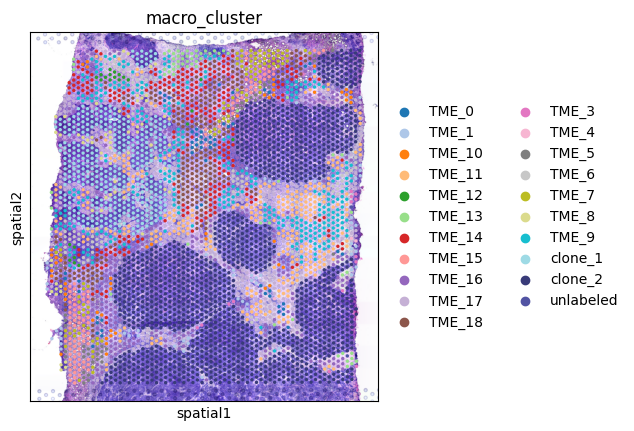

In [724]:
a = ds.section_to_adata['s0']
sc.pl.spatial(a, color=['macro_cluster'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1100: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter([], [], c=palette[label], label=label)


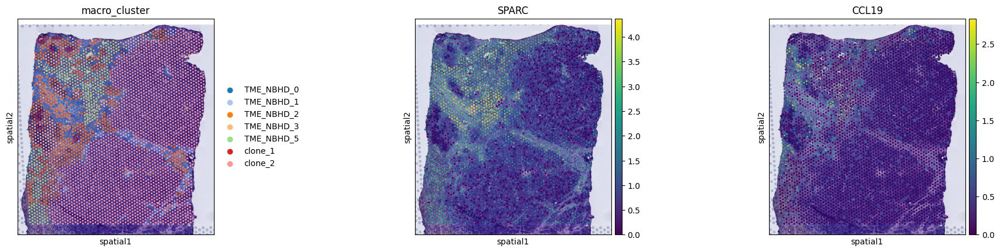

In [513]:
sc.pl.spatial(a, color=['macro_cluster', 'SPARC', 'CCL19'])

<Axes: >

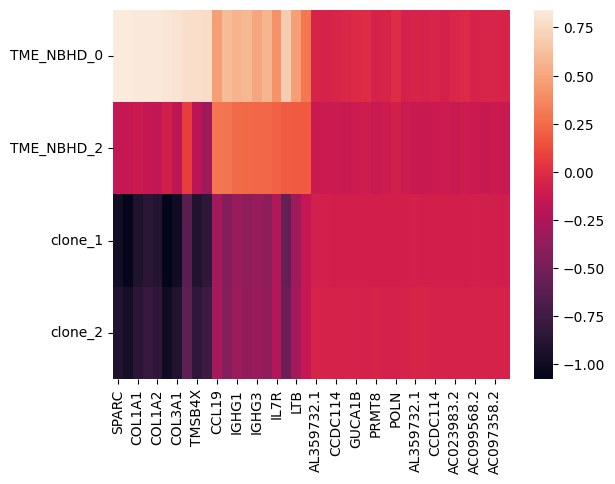

In [510]:
groups = ['TME_NBHD_0', 'TME_NBHD_2', 'clone_1', 'clone_2']
genes = [g for group in groups for g in c2g[group]]
f = macro_exp.loc[groups, genes]
sns.heatmap(f)

In [511]:
macro_exp.loc[:, ['SPARC']]

,SPARC
TME_NBHD_0,0.843190
TME_NBHD_2,-0.150860
TME_NBHD_5,0.936487
clone_2,-0.907560
TME_NBHD_1,-0.550158
clone_1,-0.985514
TME_NBHD_3,-1.724395
TME_NBHD_4,0.230018
unlabeled,0.563880


In [ ]:
degs = []
n = 20
for r, cluster in enumerate(relabeled_exp.index.to_list()):
    idxs = np.flip(relabeled_exp.loc[cluster].argsort())
    degs += relabeled_exp.columns[idxs][:n].tolist()
degs = sorted(set(degs))

deg_exp = relabeled_exp[degs]
deg_exp

In [ ]:
sns.heatmap()

In [297]:
a.obs

,in_tissue,array_row,array_col,FC1,FC2,FC3,FC4,FC5,FC6,Filtered tumor regions,...,barcode,library_id,original,sample_id,subclone,cluster,relabeled_clusters,section_id,highlight,macro_cluster
HT268B1-U1_AAACAAGTATCTCCCA-1,1,50,102,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,AAACAAGTATCTCCCA-1,HT268B1-Th1K3Fc2U1Z1Bs1,0.731283,HT268B1-U1,,8,TME_17,s0,no,TME_NBHD_0
HT268B1-U1_AAACACCAATAACTGC-1,1,59,19,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,AAACACCAATAACTGC-1,HT268B1-Th1K3Fc2U1Z1Bs1,0.581391,HT268B1-U1,,8,TME_17,s0,no,TME_NBHD_0
HT268B1-U1_AAACAGAGCGACTCCT-1,1,14,94,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,AAACAGAGCGACTCCT-1,HT268B1-Th1K3Fc2U1Z1Bs1,0.674612,HT268B1-U1,,7,TME_16,s0,no,TME_NBHD_0
HT268B1-U1_AAACAGCTTTCAGAAG-1,1,43,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,AAACAGCTTTCAGAAG-1,HT268B1-Th1K3Fc2U1Z1Bs1,0.662896,HT268B1-U1,,5,TME_14,s0,no,TME_NBHD_2
HT268B1-U1_AAACATGGTGAGAGGA-1,1,62,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,AAACATGGTGAGAGGA-1,HT268B1-Th1K3Fc2U1Z1Bs1,0.762367,HT268B1-U1,,6,TME_15,s0,no,TME_NBHD_5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT268B1-U1_TTGTTGTGTGTCAAGA-1,1,31,77,3.0,430.0,3.0,430.0,3.0,430.0,4.0,...,TTGTTGTGTGTCAAGA-1,HT268B1-Th1K3Fc2U1Z1Bs1,0.927512,HT268B1-U1,clone_2,17,clone_2,s0,no,clone_2
HT268B1-U1_TTGTTTCACATCCAGG-1,1,58,42,5.0,895.0,5.0,895.0,5.0,895.0,7.0,...,TTGTTTCACATCCAGG-1,HT268B1-Th1K3Fc2U1Z1Bs1,0.853167,HT268B1-U1,clone_2,4,clone_2,s0,no,clone_2
HT268B1-U1_TTGTTTCATTAGTCTA-1,1,60,30,5.0,895.0,5.0,895.0,5.0,895.0,7.0,...,TTGTTTCATTAGTCTA-1,HT268B1-Th1K3Fc2U1Z1Bs1,0.871534,HT268B1-U1,clone_2,4,clone_2,s0,no,clone_2
HT268B1-U1_TTGTTTCCATACAACT-1,1,45,27,1.0,249.0,1.0,249.0,1.0,249.0,7.0,...,TTGTTTCCATACAACT-1,HT268B1-Th1K3Fc2U1Z1Bs1,0.598775,HT268B1-U1,clone_2,19,clone_2,s0,no,clone_2


In [778]:
cluster_to_macro_cluster = {}
for a in ds.section_to_adata.values():
    for cluster, r_cluster, subclone in zip(a.obs['cluster'], a.obs['macro_cluster'], a.obs['subclone']):
        if 'clone' not in subclone:
            cluster_to_macro_cluster[int(cluster)] = r_cluster
cluster_to_macro_cluster

{8: 'TME_17',
 7: 'TME_16',
 5: 'TME_14',
 6: 'TME_15',
 0: 'TME_0',
 9: 'TME_18',
 2: 'TME_11',
 13: 'TME_5',
 18: 'TME_9',
 11: 'TME_3',
 4: 'TME_13',
 16: 'TME_8',
 14: 'TME_6',
 19: 'TME_10',
 1: 'TME_1',
 15: 'TME_7',
 3: 'TME_12',
 12: 'TME_4',
 17: 'unlabeled',
 10: 'TME_2'}

In [779]:
# group 10 and 16
cluster_to_macro_cluster[7] = 'group1'
cluster_to_macro_cluster[19] = 'group1'

In [780]:
macro_ids = cluster_ids.copy().astype(object)
vf = np.vectorize(cluster_to_macro_cluster.get)
macro_ids = vf(macro_ids)
macro_ids.shape, np.unique(macro_ids)

((5, 60, 60),
 array(['TME_0', 'TME_1', 'TME_11', 'TME_12', 'TME_13', 'TME_14', 'TME_15',
        'TME_17', 'TME_18', 'TME_2', 'TME_3', 'TME_4', 'TME_5', 'TME_6',
        'TME_7', 'TME_8', 'TME_9', 'group1', 'unlabeled'], dtype='<U9'))

In [781]:
for i, section in enumerate(ds.sections):
    a = ds.section_to_adata[section]
    for j, subclone in enumerate(a.obs['subclone']):
        if 'clone' in subclone:
            c, r = a.obsm['spatial_scaled'][j]
            c, r = int(c / patch_size), int(r / patch_size)
            macro_ids[i, r, c] = subclone

In [782]:
macro_ids.shape, np.unique(macro_ids)

((5, 60, 60),
 array(['TME_0', 'TME_1', 'TME_11', 'TME_12', 'TME_13', 'TME_14', 'TME_15',
        'TME_17', 'TME_18', 'TME_2', 'TME_3', 'TME_4', 'TME_5', 'TME_6',
        'TME_7', 'TME_8', 'TME_9', 'clone_1', 'clone_2', 'group1',
        'unlabeled'], dtype='<U9'))

In [783]:
macro_ids

array([[['TME_13', 'TME_13', 'TME_13', ..., 'TME_13', 'TME_13',
         'TME_13'],
        ['TME_13', 'TME_13', 'TME_13', ..., 'TME_13', 'TME_13',
         'TME_13'],
        ['TME_13', 'TME_13', 'TME_13', ..., 'TME_13', 'TME_13',
         'TME_13'],
        ...,
        ['TME_13', 'TME_13', 'TME_13', ..., 'TME_13', 'TME_13',
         'TME_13'],
        ['TME_13', 'TME_13', 'TME_13', ..., 'TME_13', 'TME_13',
         'TME_13'],
        ['TME_13', 'TME_13', 'TME_13', ..., 'TME_13', 'TME_13',
         'TME_13']],

       [['TME_13', 'TME_13', 'TME_13', ..., 'TME_13', 'TME_13',
         'TME_13'],
        ['TME_13', 'TME_13', 'TME_13', ..., 'TME_13', 'TME_13',
         'TME_13'],
        ['TME_13', 'TME_13', 'TME_13', ..., 'TME_13', 'TME_13',
         'TME_13'],
        ...,
        ['TME_13', 'TME_13', 'TME_13', ..., 'TME_13', 'TME_13',
         'TME_13'],
        ['TME_13', 'TME_13', 'TME_13', ..., 'TME_13', 'TME_13',
         'TME_13'],
        ['TME_13', 'TME_13', 'TME_13', ..., 'TME

In [784]:
from torchio.transforms import Resize


In [785]:
order = np.unique(macro_ids).tolist()
volume = np.zeros((macro_ids.shape[0], macro_ids.shape[1], macro_ids.shape[2], len(order)))
for label in order:
    volume[..., order.index(label)] = macro_ids == label
volume = volume.astype(np.float32)
volume.shape, np.unique(volume)
    

((5, 60, 60, 21), array([0., 1.], dtype=float32))

In [879]:
from mushroom.data.visium import get_fullres_size
get_fullres_size(a)

(19866.76137141567, 19596.655379961823)

In [881]:
19866 / (150 / 65)

8608.6

In [882]:
8606 / 320


26.89375

In [877]:
next(iter(a.uns['spatial'].values()))['scalefactors']

{'fiducial_diameter_fullres': 243.77317662074375,
 'spot_diameter_fullres': 150.90720457474615,
 'tissue_hires_scalef': 0.10736526,
 'tissue_lowres_scalef': 0.032209575}

In [786]:
section_positions = np.asarray([0, 4, 5, 6, 7]) * 2

In [787]:
macro_ords = macro_ids.copy().astype(object)
vf = np.vectorize(order.index)
macro_ords = vf(macro_ords)
macro_ords.shape, np.unique(macro_ords)

((5, 60, 60),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20]))

In [788]:
section_positions = np.asarray([0, 4, 5, 6, 7]) * 2
section_range = (section_positions.min(), section_positions.max())

interp_volume = np.zeros((section_range[-1], macro_ords.shape[-2], macro_ords.shape[-1]), dtype=int)
for i in range(macro_ords.shape[0] - 1):
    print(i)
    l1, l2 = section_positions[i], section_positions[i+1]
    stack = rearrange(macro_ords[i:i+2], 'n h w -> 1 n h w')
    transform = Resize((l2 - l1, stack.shape[-2], stack.shape[-1]), image_interpolation='label_gaussian')
    resized = transform(stack)
    interp_volume[l1:l2] = rearrange(resized, '1 n h w -> n h w')

interp_volume.shape

0
1
2
3


(14, 60, 60)

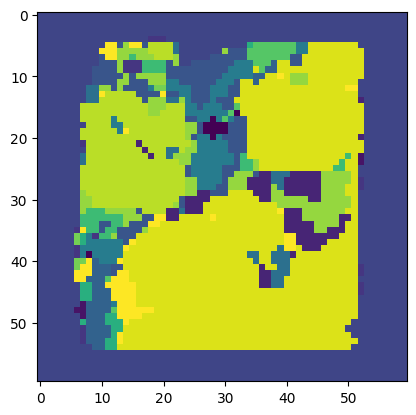

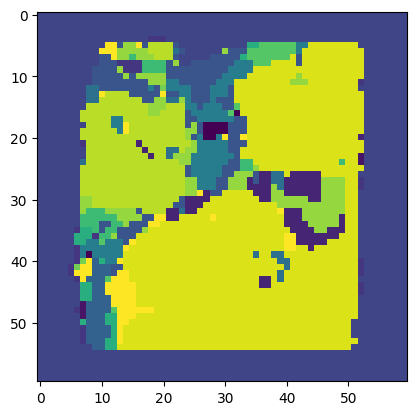

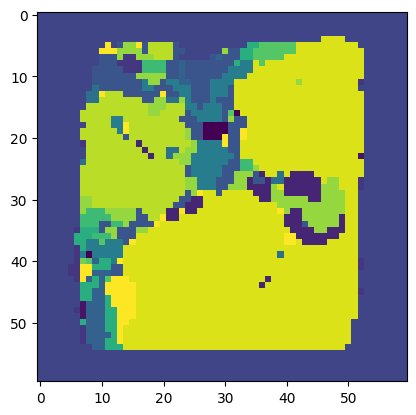

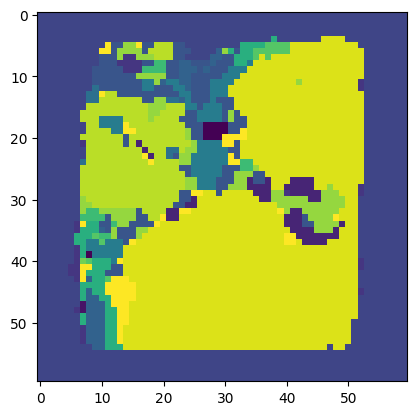

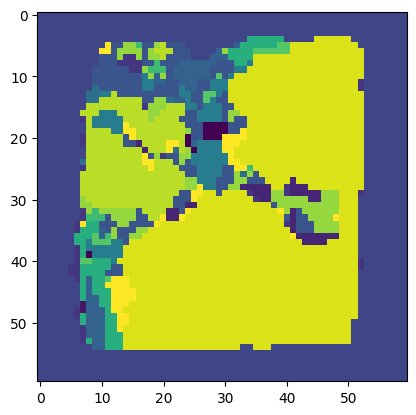

...

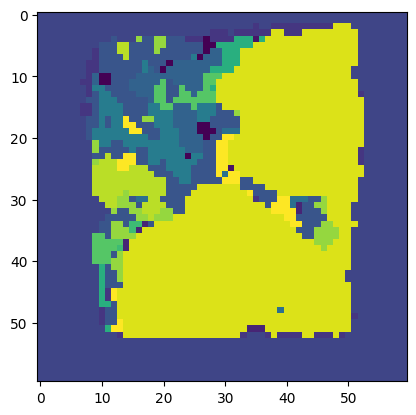

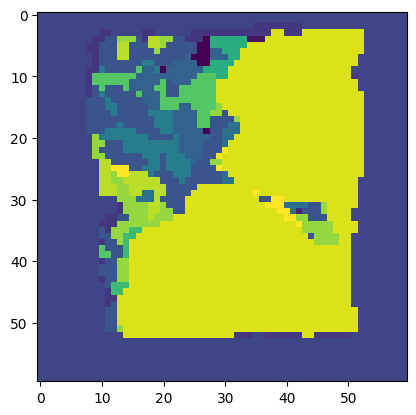

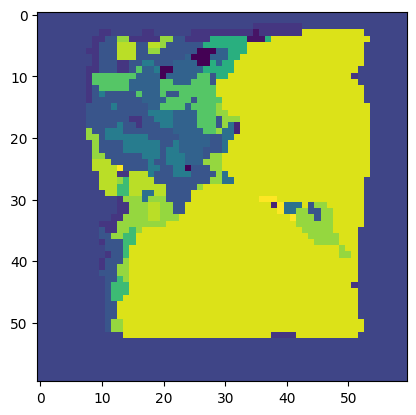

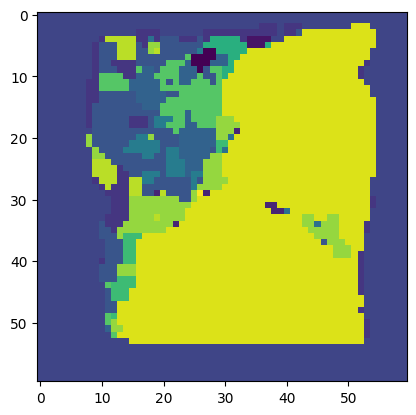

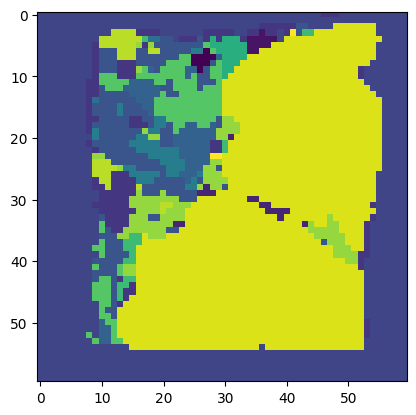

In [789]:
for img in interp_volume:
    plt.imshow(img)
    plt.show()

In [790]:
# volume = rearrange(out, 'n z h w -> z h w n')
np.save('/data/estorrs/mushroom/data/projects/subclone/mushroom/HT268B1_vae_vq/outputs/analysis_output_v5.npy',
        {
            'interp_volume': interp_volume,
            'labels': order
        }
)

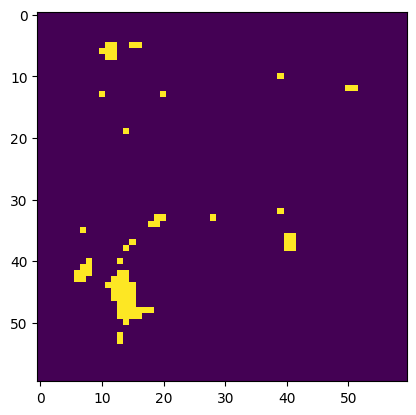

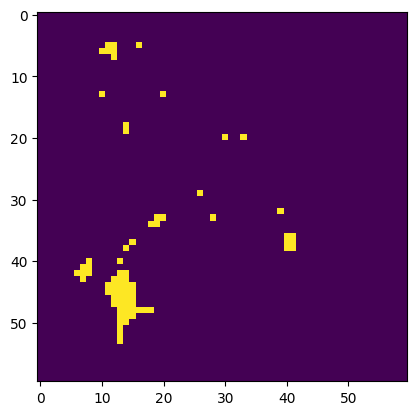

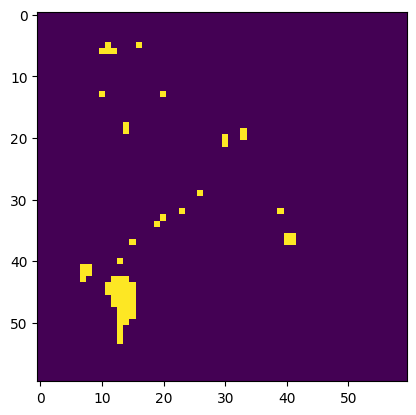

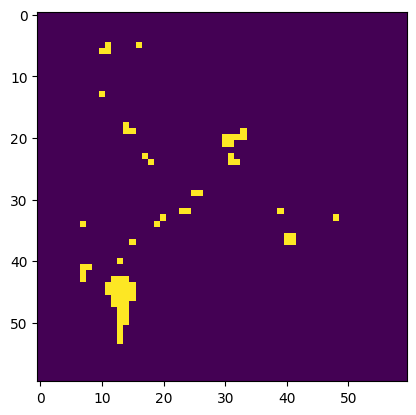

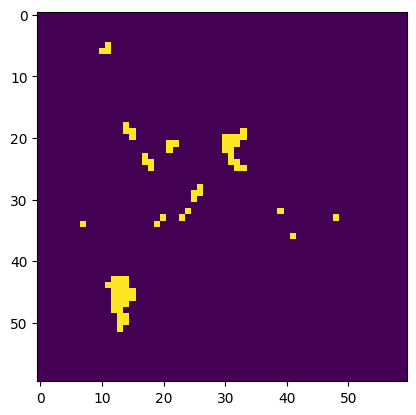

...

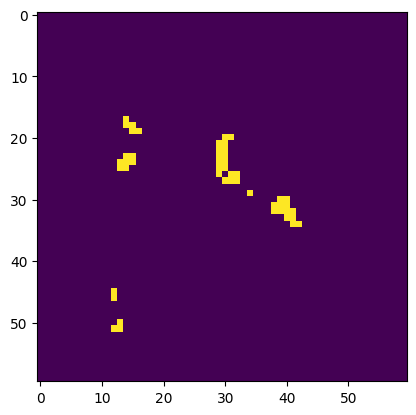

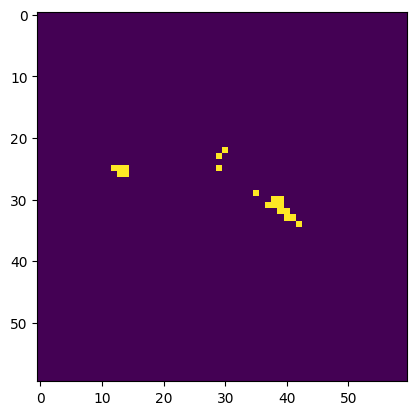

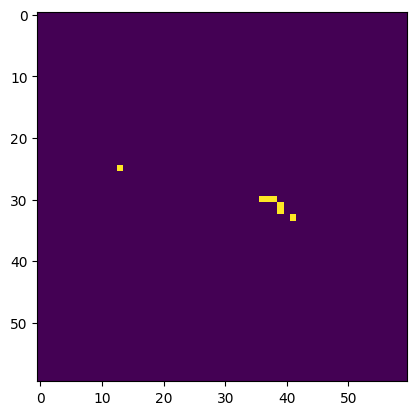

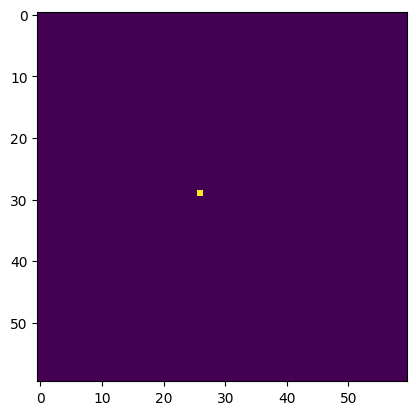

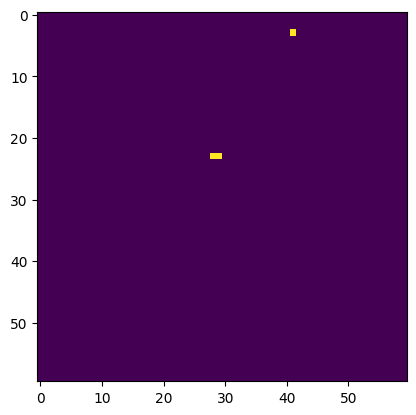

In [792]:
for img in interp_volume:
    plt.imshow(img==order.index('group1'))
    plt.show()

In [795]:
tables = []
for section, a in ds.section_to_adata.items():
    tables.append(a.obs)
table = pd.concat(tables)
table


,in_tissue,array_row,array_col,FC1,FC2,FC3,FC4,FC5,FC6,Filtered tumor regions,...,barcode,library_id,original,sample_id,subclone,cluster,relabeled_clusters,section_id,highlight,macro_cluster
HT268B1-U1_AAACAAGTATCTCCCA-1,1,50,102,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,AAACAAGTATCTCCCA-1,HT268B1-Th1K3Fc2U1Z1Bs1,0.731283,HT268B1-U1,,8,TME_17,s0,no,TME_17
HT268B1-U1_AAACACCAATAACTGC-1,1,59,19,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,AAACACCAATAACTGC-1,HT268B1-Th1K3Fc2U1Z1Bs1,0.581391,HT268B1-U1,,8,TME_17,s0,no,TME_17
HT268B1-U1_AAACAGAGCGACTCCT-1,1,14,94,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,AAACAGAGCGACTCCT-1,HT268B1-Th1K3Fc2U1Z1Bs1,0.674612,HT268B1-U1,,7,TME_16,s0,no,TME_16
HT268B1-U1_AAACAGCTTTCAGAAG-1,1,43,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,AAACAGCTTTCAGAAG-1,HT268B1-Th1K3Fc2U1Z1Bs1,0.662896,HT268B1-U1,,5,TME_14,s0,no,TME_14
HT268B1-U1_AAACATGGTGAGAGGA-1,1,62,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,AAACATGGTGAGAGGA-1,HT268B1-Th1K3Fc2U1Z1Bs1,0.762367,HT268B1-U1,,6,TME_15,s0,no,TME_15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT268B1-U32_TTGTTGTGTGTCAAGA-1,1,31,77,7.0,1296.0,7.0,1296.0,7.0,1296.0,2.0,...,TTGTTGTGTGTCAAGA-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.884026,HT268B1-U32,clone_2,10,clone_2,s4,no,clone_2
HT268B1-U32_TTGTTTCACATCCAGG-1,1,58,42,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,TTGTTTCACATCCAGG-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.742382,HT268B1-U32,,3,TME_12,s4,no,TME_12
HT268B1-U32_TTGTTTCATTAGTCTA-1,1,60,30,2.0,232.0,2.0,232.0,2.0,232.0,1.0,...,TTGTTTCATTAGTCTA-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.811824,HT268B1-U32,clone_2,2,clone_2,s4,no,clone_2
HT268B1-U32_TTGTTTCCATACAACT-1,1,45,27,7.0,1234.0,7.0,1234.0,7.0,1234.0,1.0,...,TTGTTTCCATACAACT-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.863733,HT268B1-U32,clone_2,2,clone_2,s4,no,clone_2


In [796]:
table.to_csv('/data/estorrs/mushroom/data/projects/subclone/mushroom/HT268B1_vae_vq/outputs/metadata_table.txt',
            sep='\t')


In [798]:
c2g['TME_10'], c2g['TME_16']

(Index(['CXCL9', 'LILRB4', 'C15orf48', 'CXCL13', 'FCGR1A', 'SLAMF8', 'TIGIT',
        'OLR1', 'SLAMF7', 'IDO1'],
       dtype='object'),
 Index(['SLC16A3', 'MXRA5', 'PDCD1', 'DUSP4', 'COL11A1', 'SFRP4', 'TIGIT',
        'CTLA4', 'HTRA3', 'LAG3'],
       dtype='object'))

In [801]:
c2g['clone_1'], c2g['clone_2']

(Index(['STX18-AS1', 'FBXO36', 'CBARP', 'AC005674.2', 'AC087500.1', 'KCND1',
        'OTUD7A', 'DND1', 'PCDHB15', 'SMPD3'],
       dtype='object'),
 Index(['STX18-AS1', 'FBXO36', 'CBARP', 'AC005674.2', 'AC087500.1', 'DND1',
        'OTUD7A', 'PCDHB15', 'AP002026.1', 'KCND1'],
       dtype='object'))

In [813]:
f = relabeled_exp.loc[:,
#     ['TME_10', 'TME_16', 'clone_1', 'clone_2'],
    ['CXCL9', 'LILRB4', 'C15orf48', 'CXCL13', 'FCGR1A', 'SLAMF8', 'TIGIT', 'OLR1', 'SLAMF7', 'IDO1',
    'SLC16A3', 'MXRA5', 'PDCD1', 'DUSP4', 'COL11A1', 'SFRP4', 'TIGIT', 'CTLA4', 'HTRA3', 'LAG3',]]
#     'ALB', 'SERPINA1']]
f

,CXCL9,LILRB4,C15orf48,CXCL13,FCGR1A,SLAMF8,TIGIT,OLR1,SLAMF7,IDO1,SLC16A3,MXRA5,PDCD1,DUSP4,COL11A1,SFRP4,TIGIT,CTLA4,HTRA3,LAG3
TME_0,0.322255,0.597109,0.169423,0.108033,0.377170,0.541176,0.335342,0.066936,0.364826,-0.034873,0.306992,0.403485,0.217707,0.270445,0.066271,0.367759,0.335342,0.120715,0.599219,0.255638
TME_1,-0.021892,-0.122032,0.042824,-0.040700,0.000935,-0.112767,-0.062498,0.042702,-0.087072,0.033951,-0.063030,-0.055336,-0.097906,0.003838,0.041400,-0.124330,-0.062498,0.015860,-0.111705,-0.000863
TME_2,-0.274968,-0.235415,-0.152828,-0.219799,-0.212729,-0.225294,-0.156538,-0.138299,-0.187614,-0.133311,-0.210384,-0.193270,-0.148192,-0.146387,-0.073681,-0.260952,-0.156538,-0.091701,-0.263820,-0.185968
TME_3,-0.149932,-0.141878,-0.068830,-0.110897,-0.062647,-0.178670,-0.106444,-0.023821,-0.097687,0.071460,-0.078495,-0.062995,-0.105099,0.016993,0.048436,-0.132384,-0.106444,0.023042,-0.124021,-0.023230
TME_4,-0.351012,-0.272026,-0.211088,-0.245399,-0.260176,-0.263861,-0.191116,-0.195017,-0.213371,-0.191127,-0.246599,-0.263179,-0.166621,-0.196816,-0.134268,-0.286272,-0.191116,-0.119941,-0.310926,-0.242622
TME_5,1.000169,0.607234,0.405777,0.258614,0.467954,0.569206,0.308683,0.120381,0.557068,0.258243,0.336022,0.411566,0.176496,0.166657,0.062448,-0.017895,0.308683,0.177952,0.012766,0.371803
TME_6,-0.381820,-0.284197,-0.283034,-0.244919,-0.308127,-0.249093,-0.184569,-0.273447,-0.183594,-0.275199,-0.283807,-0.314690,-0.149184,-0.209839,-0.177296,-0.278009,-0.184569,-0.138714,-0.328876,-0.259704
TME_7,-0.001007,0.133104,-0.062576,-0.164570,0.010604,0.168212,0.007172,-0.139326,0.023546,-0.189405,0.037425,0.074553,0.083814,0.033110,-0.119052,-0.152417,0.007172,-0.035969,-0.207666,-0.007356
TME_8,-0.013627,0.251402,0.677149,0.358098,0.062783,0.326180,0.031277,0.383572,0.317702,0.653118,0.367834,0.239514,0.037727,0.088851,-0.017470,0.072703,0.031277,0.067740,0.340246,0.372920
TME_9,-0.127553,-0.054704,-0.146250,-0.004545,-0.138446,-0.004830,0.011021,-0.157520,-0.018215,-0.129216,-0.085653,-0.141881,0.047680,-0.073517,-0.077776,-0.008973,0.011021,-0.032132,-0.061810,-0.045599


<Axes: >

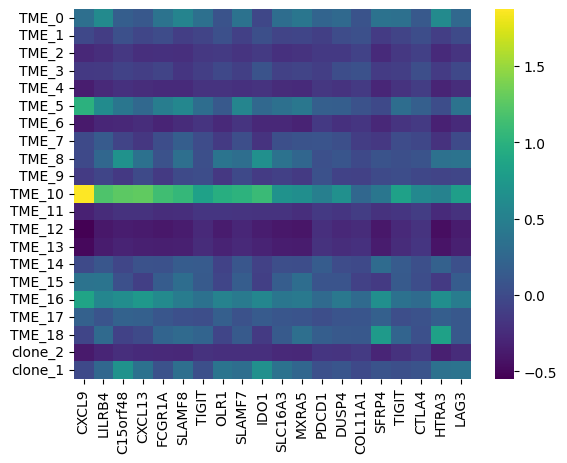

In [814]:
sns.heatmap(f, cmap='viridis')

In [821]:
genes = [
    'IL7R',
    'CD8A',
    'GZMB',
    'CD68',
    'CD163',
    'LYZ',
    'CXCL9',
    'HLA-DRA',
    'FCGR1A',
    'TIGIT',
    'PDCD1',
    'LAG3',
    'CTLA4',
    'ACTA2',
    'SPARC',
    'BGN',
    'SERPINA1',
    'ALB'
]

In [832]:
# relabeled_exp_true = []
# indices = [f'TME_{i}' for i in range(len(tme_cluster_to_orig))]
# for i in tme_cluster_to_orig:
#     mask = cluster_ids == int(i)
#     x = rearrange(mushroom.true_imgs, 'n d h w -> d n h w')
#     relabeled_exp_true.append(x[:, mask].mean(-1))

# for subclone, clusters in clone_to_cluster.items():
#     indices.append(subclone)
    
#     mask = []
#     for i in clusters:
#         mask.append(cluster_ids == int(i))
#     mask = np.stack(mask).sum(0) > 0
    
#     x = rearrange(mushroom.true_imgs, 'n d h w -> d n h w')
#     relabeled_exp_true.append(x[:, mask].mean(-1))
    
# relabeled_exp_true = torch.stack(relabeled_exp_true)
# relabeled_exp_true = pd.DataFrame(data=relabeled_exp_true.numpy(), columns=mushroom.learner.channels, index=indices)
# relabeled_exp_true = relabeled_exp_true[~pd.isnull(relabeled_exp_true.iloc[:, 0])]
# relabeled_exp_true


In [827]:
combined.obs

,in_tissue,array_row,array_col,FC1,FC2,FC3,FC4,FC5,FC6,Filtered tumor regions,...,barcode,library_id,original,sample_id,subclone,cluster,relabeled_clusters,section_id,highlight,macro_cluster
HT268B1-U1_AAACAAGTATCTCCCA-1,1,50,102,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,AAACAAGTATCTCCCA-1,HT268B1-Th1K3Fc2U1Z1Bs1,0.731283,HT268B1-U1,,8,TME_17,s0,no,TME_NBHD_1
HT268B1-U1_AAACACCAATAACTGC-1,1,59,19,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,AAACACCAATAACTGC-1,HT268B1-Th1K3Fc2U1Z1Bs1,0.581391,HT268B1-U1,,8,TME_17,s0,no,TME_NBHD_1
HT268B1-U1_AAACAGAGCGACTCCT-1,1,14,94,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,AAACAGAGCGACTCCT-1,HT268B1-Th1K3Fc2U1Z1Bs1,0.674612,HT268B1-U1,,7,TME_16,s0,no,TME_NBHD_1
HT268B1-U1_AAACAGCTTTCAGAAG-1,1,43,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,AAACAGCTTTCAGAAG-1,HT268B1-Th1K3Fc2U1Z1Bs1,0.662896,HT268B1-U1,,5,TME_14,s0,no,TME_NBHD_0
HT268B1-U1_AAACATGGTGAGAGGA-1,1,62,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,AAACATGGTGAGAGGA-1,HT268B1-Th1K3Fc2U1Z1Bs1,0.762367,HT268B1-U1,,6,TME_15,s0,no,TME_NBHD_2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT268B1-U32_TTGTTGTGTGTCAAGA-1,1,31,77,7.0,1296.0,7.0,1296.0,7.0,1296.0,2.0,...,TTGTTGTGTGTCAAGA-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.884026,HT268B1-U32,clone_2,10,clone_2,s4,yes,clone_2
HT268B1-U32_TTGTTTCACATCCAGG-1,1,58,42,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,TTGTTTCACATCCAGG-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.742382,HT268B1-U32,,3,TME_12,s4,no,TME_NBHD_7
HT268B1-U32_TTGTTTCATTAGTCTA-1,1,60,30,2.0,232.0,2.0,232.0,2.0,232.0,1.0,...,TTGTTTCATTAGTCTA-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.811824,HT268B1-U32,clone_2,2,clone_2,s4,yes,clone_2
HT268B1-U32_TTGTTTCCATACAACT-1,1,45,27,7.0,1234.0,7.0,1234.0,7.0,1234.0,1.0,...,TTGTTTCCATACAACT-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.863733,HT268B1-U32,clone_2,2,clone_2,s4,yes,clone_2


In [839]:
sc.settings.figdir = '/data/estorrs/mushroom/data/projects/subclone/mushroom/HT268B1_vae_vq/outputs'

In [843]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/scanpy/tools/_dendrogram.py:161: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = dat


/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:FFTM dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 53 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'L', 'M', 'N', 'P', 'R', 'S', 'T', 'X', 'Y', 'Z', 'a', 'c', 'e', 'eight', 'f', 'five', 'four', 'g', 'hyphen', 'i', 'l', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'percent', 'r', 's', 'seven',

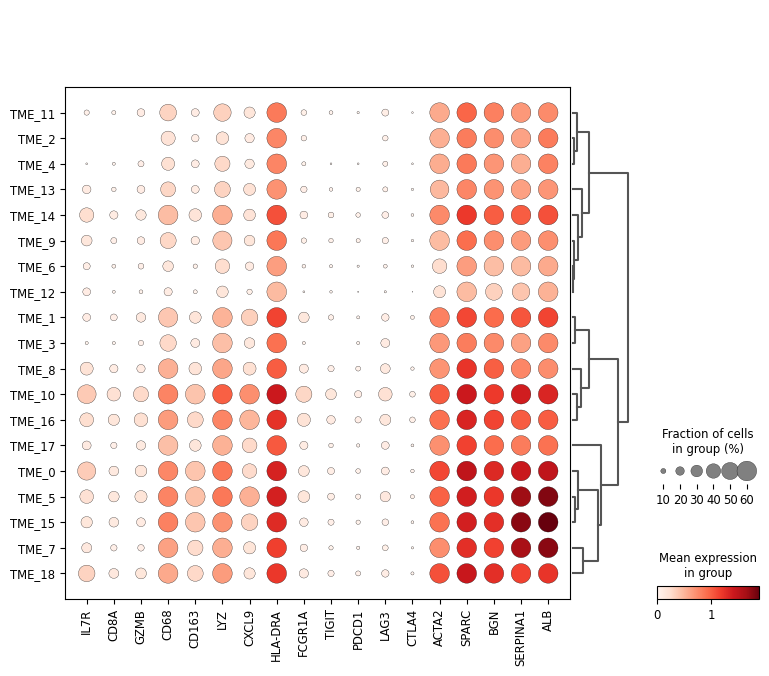

In [844]:
f = combined[[True if 'TME' in g else False for g in combined.obs['relabeled_clusters']]]
sc.tl.dendrogram(f, groupby='relabeled_clusters')
sc.pl.dotplot(
    f,
    groupby='relabeled_clusters', var_names=genes, dendrogram=True, dot_max=.6,
    save='expression.pdf')